In [1]:
# unicode, regex, json for text digestion
import unicodedata
import re
import json
from wordcloud import WordCloud

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
# nltk: natural language toolkit -> tokenization, stopwords (more on this soon)
import nltk
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords

from prepare import *


# pandas dataframe manipulation, acquire script, time formatting
import pandas as pd
from time import strftime

# shh, down in front
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_json('data.json')

In [3]:
df = prep_repos(df)

In [4]:
df

,repo,language,original,clean,stemmed,lemmatized,language_reduced
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...,Other
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...,Python
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github stars https imgshieldsio github stars d...,github star http imgshieldsio github star digi...,github star http imgshieldsio github star digi...,JavaScript
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logo flutterdev build status cirrus bu...,flutter logo flutterdev build statu cirru buil...,flutter logo flutterdev build status cirrus bu...,Other
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...,Python
...,...,...,...,...,...,...,...
107,artsy/artsy.github.io,SCSS,[![Build Status](https://circleci.com/gh/artsy...,build status https circlecicom gh artsy artsyg...,build statu http circlecicom gh artsi artsygit...,build status http circlecicom gh artsy artsygi...,Other
108,OSGeo/osgeo,CSS,# The Open Source Geospatial Foundation\n\nThe...,open source geospatial foundation open source ...,open sourc geospati foundat open sourc geospat...,open source geospatial foundation open source ...,Other
110,cloudflare/cloudflare.github.io,CSS,cloudflare.github.io\n====================\n\n...,cloudflaregithubio source code https cloudflar...,cloudflaregithubio sourc code http cloudflareg...,cloudflaregithubio source code http cloudflare...,Other
111,eleme/eleme.github.io,CSS,# Team Blog\n\nRequirements to join this blog:...,team blog requirements join blog 1 must develo...,team blog requir join blog 1 must develop elem...,team blog requirement join blog 1 must develop...,Other


In [5]:
df[df.language.isna()]

,repo,language,original,clean,stemmed,lemmatized,language_reduced


In [6]:
df = df.dropna()

In [7]:
df[df.original == ""]

,repo,language,original,clean,stemmed,lemmatized,language_reduced


In [8]:
df['original'] = df.original.apply(lambda text: np.nan if text == '' else text)

In [9]:
df

,repo,language,original,clean,stemmed,lemmatized,language_reduced
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...,Other
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...,Python
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github stars https imgshieldsio github stars d...,github star http imgshieldsio github star digi...,github star http imgshieldsio github star digi...,JavaScript
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logo flutterdev build status cirrus bu...,flutter logo flutterdev build statu cirru buil...,flutter logo flutterdev build status cirrus bu...,Other
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...,Python
...,...,...,...,...,...,...,...
107,artsy/artsy.github.io,SCSS,[![Build Status](https://circleci.com/gh/artsy...,build status https circlecicom gh artsy artsyg...,build statu http circlecicom gh artsi artsygit...,build status http circlecicom gh artsy artsygi...,Other
108,OSGeo/osgeo,CSS,# The Open Source Geospatial Foundation\n\nThe...,open source geospatial foundation open source ...,open sourc geospati foundat open sourc geospat...,open source geospatial foundation open source ...,Other
110,cloudflare/cloudflare.github.io,CSS,cloudflare.github.io\n====================\n\n...,cloudflaregithubio source code https cloudflar...,cloudflaregithubio sourc code http cloudflareg...,cloudflaregithubio source code http cloudflare...,Other
111,eleme/eleme.github.io,CSS,# Team Blog\n\nRequirements to join this blog:...,team blog requirements join blog 1 must develo...,team blog requir join blog 1 must develop elem...,team blog requirement join blog 1 must develop...,Other


In [10]:
df.language.value_counts(normalize=True)

JavaScript          15
Python              15
TypeScript          10
HTML                 8
CSS                  7
Rust                 7
Go                   5
Jupyter Notebook     4
Java                 3
SCSS                 3
C#                   3
C                    2
Ruby                 2
Shell                2
Dart                 2
C++                  2
Julia                1
Swift                1
SWIG                 1
PHP                  1
PowerShell           1
V                    1
Vim script           1
Assembly             1
Vue                  1
Name: language, dtype: int64

In [11]:
df.language_reduced.value_counts(normalize=True)

JavaScript          0.151515
Python              0.151515
TypeScript          0.101010
HTML                0.080808
CSS                 0.070707
Rust                0.070707
Go                  0.050505
Jupyter Notebook    0.040404
Java                0.030303
SCSS                0.030303
C#                  0.030303
C                   0.020202
Ruby                0.020202
Shell               0.020202
Dart                0.020202
C++                 0.020202
Julia               0.010101
Swift               0.010101
SWIG                0.010101
PHP                 0.010101
PowerShell          0.010101
V                   0.010101
Vim script          0.010101
Assembly            0.010101
Vue                 0.010101
Name: language, dtype: float64

In [12]:
py_words = ' '.join(df[df.language == 'Python'].clean)
java_words = ' '.join(df[df.language == 'JavaScript'].clean)
html_words = ' '.join(df[df.language == 'HTML'].clean)
types_words = ' '.join(df[df.language == 'TypeScript'].clean)
css_words = ' '.join(df[df.language == 'CSS'].clean)
all_words = ' '.join(df.clean)


In [13]:
py_words[:1000]

'h1 aligncenter nuclei templates h1 h4 aligncentercommunity curated list templates nuclei engine find security vulnerabilities applications h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq templates faqs hrefhttps discordgg projectdiscoveryjoin discord p templates core nuclei scanner https githubcom projectdiscovery nuclei powers actual scanning engine repository s

In [14]:
java_words[:1000]

'github stars https imgshieldsio github stars digitalocean nginxconfigiosvg https githubcom digitalocean nginxconfigio stargazers github contributors https imgshieldsio github contributors digitalocean nginxconfigiosvgcolorblue https githubcom digitalocean nginxconfigio graphs contributors mit license https imgshieldsio github license digitalocean nginxconfigiosvgcolorblue https githubcom digitalocean nginxconfigio blob master license br closed issues https imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreen https githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed pr https imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreen https githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issues https imgshieldsio github issuesraw digitalocean nginxconfigiosvg https githubcom digitalocean nginxconfigio issues open pr https imgshieldsio github issuesprraw digitalocean nginxconfigiosvg https githubcom 

In [15]:
html_words[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming frameworks goal making web friendly hackable place anyone author interesting interactive applications get started see gettingstarted gettingstartedmd examples see pyscript folder pyscriptjs longer version pyscript meta project aims combine multiple open technologies framework allows users create sophisticated browser applications python integrates seamlessly way dom works browser allows users add python logic way feels natural web python developers try pyscript try pyscript import appropriate pyscript files html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript components html page pyscript currently implements following elements pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows users write execu

In [16]:
types_words[:1000]

'p aligncenter img width300 srchttps rawgithubusercontentcom supabase supabase master web static supabaselightroundedcornerbackgroundsvg p supabase supabase https supabasecom open source firebase alternative building features firebase using enterprisegrade open source tools x hosted postgres database docs https supabasecom docs guides database x authentication authorization docs https supabasecom docs guides auth x autogenerated apis x rest docs https supabasecom docs guides apirestapi x realtime subscriptions docs https supabasecom docs guides apirealtimeapi x graphql beta docs https supabasecom docs guides apigraphqlapi x functions x database functions docs https supabasecom docs guides database functions x edge functions docs https supabasecom docs guides functions x file storage docs https supabasecom docs guides storage x dashboard supabase dashboard https rawgithubusercontentcom supabase supabase master apps www public images github supabasedashboardpng documentation full documen

In [17]:
css_words[:1000]

'50 projects 50 days html css javascript main repository projects course course link https wwwudemycom course 50projects50days course info website https 50projects50dayscom project live demo 01 expanding cards https githubcom bradtraversy 50projects50days tree master expandingcards live demo https 50projects50dayscom projects expandingcards 02 progress steps https githubcom bradtraversy 50projects50days tree master progresssteps live demo https 50projects50dayscom projects progresssteps 03 rotating navigation animation https githubcom bradtraversy 50projects50days tree master rotatingnavanimation live demo https 50projects50dayscom projects rotatingnavigationanimation 04 hidden search widget https githubcom bradtraversy 50projects50days tree master hiddensearch live demo https 50projects50dayscom projects hiddensearchwidget 05 blurry loading https githubcom bradtraversy 50projects50days tree master blurryloading live demo https 50projects50dayscom projects blurryloading 06 scroll anima

In [18]:
all_words[:1000]

'googletest announcements live head googletest follows abseil live head philosophy https abseilio philosophyupgradesupport recommend updating latest commit main branch often possible https githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation updates documentation live github pages https googlegithubio googletest recommend browsing documentation github pages rather directly repository release 1110 release 1110 https githubcom google googletest releases tag release1110 available coming soon planning take dependency abseil https githubcom abseil abseilcpp documentation improvements planned welcome googletest googles c test framework repository merger formerly separate googletest googlemock projects closely related makes sense maintain release together getting started see googletest users guide https googlegithubio googletest documentation recommend starting googletest primer https googlegithubio googletest primerhtml information building googletest found

In [19]:
py_freq = pd.Series(py_words.split()).value_counts()
java_freq = pd.Series(java_words.split()).value_counts()
html_freq = pd.Series(html_words.split()).value_counts()
types_freq = pd.Series(types_words.split()).value_counts()
css_freq = pd.Series(css_words.split()).value_counts()
all_freq = pd.Series(all_words.split()).value_counts()


In [20]:
py_freq

https                                                 2112
yes                                                   1734
unknown                                                913
details                                                855
api                                                    596
                                                      ... 
fromcachetoinmemorydatagridintroductiontohazelcast       1
redismemcached                                           1
kxtjqgepng                                               1
rgsrvjgpng                                               1
condition                                                1
Length: 9956, dtype: int64

In [21]:
java_freq

https                 322
src                   158
githubcom             130
algorithms            124
readmemd               84
                     ... 
readmecnmd              1
hiring                  1
pro                     1
forumserverlesscom      1
file2                   1
Length: 2475, dtype: int64

In [22]:
html_freq

https             70
docker            50
githubcom         47
master            37
awesomecompose    36
                  ..
give               1
purpose            1
summary            1
sophisticated      1
didi               1
Length: 610, dtype: int64

In [23]:
types_freq

https                       334
githubcom                   282
td                          265
hrefhttps                   260
appsmith                    152
                           ... 
noreferrerpostgrestkt         1
postgrestkt                   1
howtocontributedebugging      1
tdkotlin                      1
details                       1
Length: 2194, dtype: int64

In [24]:
css_freq

https         121
projects       56
githubcom      55
live           53
master         53
             ... 
popularity      1
last            1
push            1
select          1
need            1
Length: 834, dtype: int64

In [25]:
all_freq

https                  4088
yes                    1758
githubcom              1255
unknown                 913
details                 877
                       ... 
tomact                    1
namedevopsadvanced        1
namejenkinsbeginner       1
bamboo                    1
didi                      1
Length: 18679, dtype: int64

In [26]:
word_counts = pd.concat([py_freq, java_freq, html_freq, types_freq, css_freq, all_freq], axis=1).fillna(0).astype(int)
word_counts.columns = ['python', 'java', 'html', 'typescript', 'css', 'all']

In [27]:
word_counts.sort_values('all', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,4088
yes,1734,2,0,0,0,1758
githubcom,306,130,47,282,55,1255
unknown,913,0,0,0,0,913
details,855,1,3,1,0,877
api,596,16,0,21,6,697
b,455,81,0,95,1,687
apikey,595,0,0,0,0,595
http,303,26,15,5,28,506
data,376,32,0,14,8,480


In [28]:
word_counts.sort_values('python', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,4088
yes,1734,2,0,0,0,1758
unknown,913,0,0,0,0,913
details,855,1,3,1,0,877
api,596,16,0,21,6,697
apikey,595,0,0,0,0,595
b,455,81,0,95,1,687
summarybrb,400,0,0,0,0,400
data,376,32,0,14,8,480
githubcom,306,130,47,282,55,1255


In [29]:
word_counts.sort_values('java', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,4088
src,13,158,0,3,0,215
githubcom,306,130,47,282,55,1255
algorithms,12,124,0,2,0,139
readmemd,55,84,1,3,1,210
b,455,81,0,95,1,687
github,25,76,18,15,12,255
serverless,0,54,0,0,0,56
terrad,0,49,0,0,0,49
learn,6,41,1,101,1,186


In [30]:
word_counts.sort_values('html', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,4088
docker,28,5,50,10,0,143
githubcom,306,130,47,282,55,1255
master,103,18,37,16,53,326
awesomecompose,0,0,36,0,0,36
tree,111,14,36,1,50,269
sample,2,2,24,2,0,32
github,25,76,18,15,12,255
nginx,3,12,18,0,0,34
pyscript,0,0,15,0,0,15


In [31]:
word_counts.sort_values('typescript', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,4088
githubcom,306,130,47,282,55,1255
td,52,0,0,265,0,326
hrefhttps,68,29,1,260,0,401
appsmith,0,0,0,152,0,152
br,99,13,0,128,0,254
appsmithorg,0,0,0,114,0,114
srchttps,45,10,1,108,1,217
wwwfreecodecamporg,0,0,0,103,0,103
learn,6,41,1,101,1,186


In [32]:
word_counts.sort_values('css', ascending=False).head(25)

,python,java,html,typescript,css,all
https,2112,322,70,334,121,4088
projects,13,15,3,20,56,168
githubcom,306,130,47,282,55,1255
live,13,1,0,2,53,75
master,103,18,37,16,53,326
demo,4,1,0,0,51,63
50projects50days,0,0,0,0,51,51
50projects50dayscom,0,0,0,0,51,51
tree,111,14,36,1,50,269
bradtraversy,0,0,0,0,50,50


In [33]:
# set up some basic matplotlib style parameters
plt.rc('figure', figsize=(17, 10))
plt.style.use('seaborn-darkgrid')

Text(0.5, 1.0, 'Top 25 Most Frequent Overall Words')

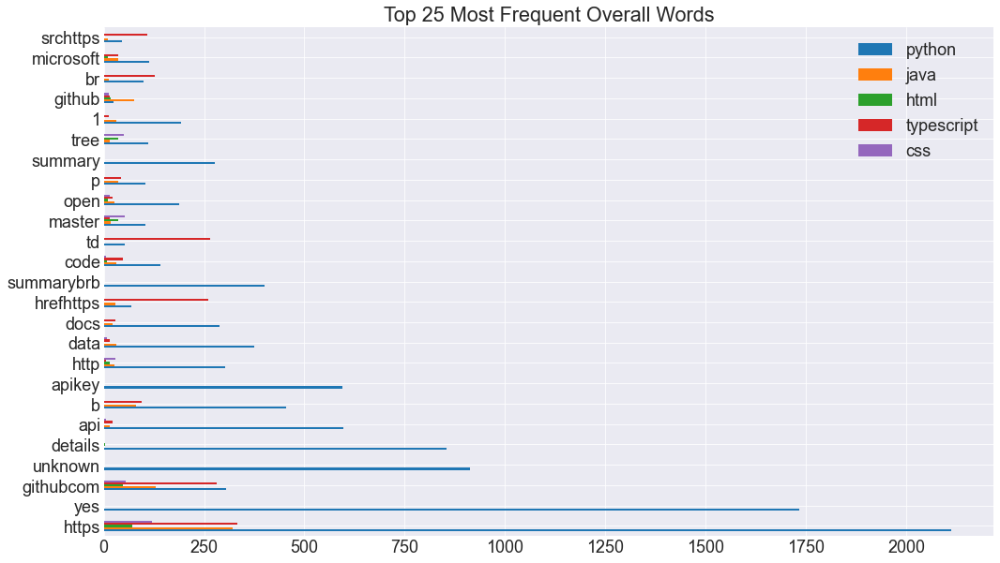

In [34]:
plt.rc('font', size=18)
word_counts.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'typescript', 'css']].plot.barh()
plt.title('Top 25 Most Frequent Overall Words')

## Python words

<AxesSubplot:>

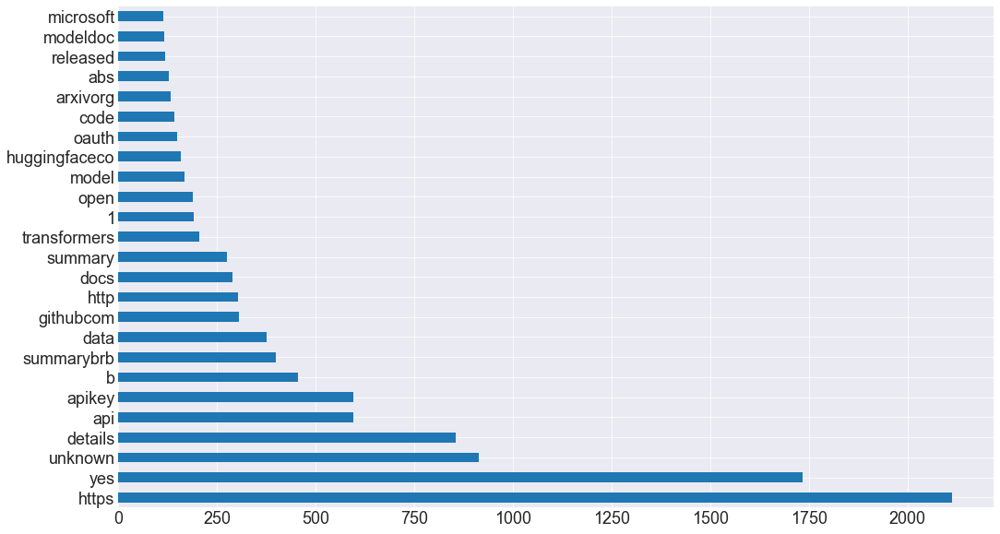

In [35]:
py_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

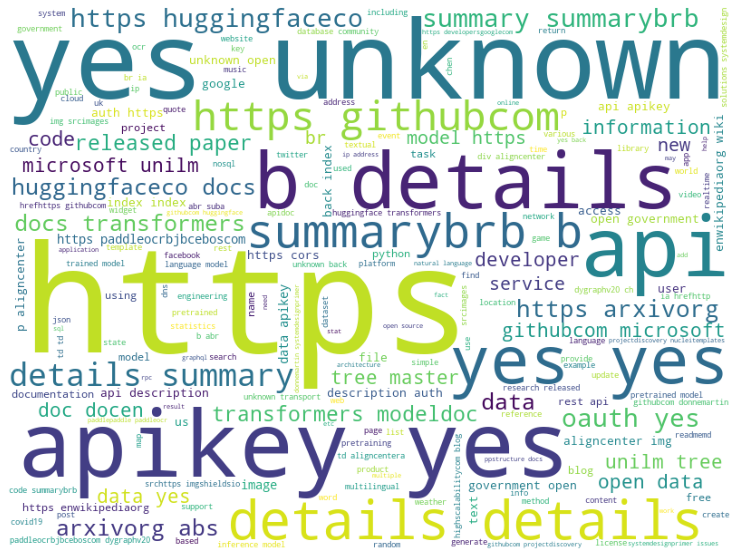

In [36]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

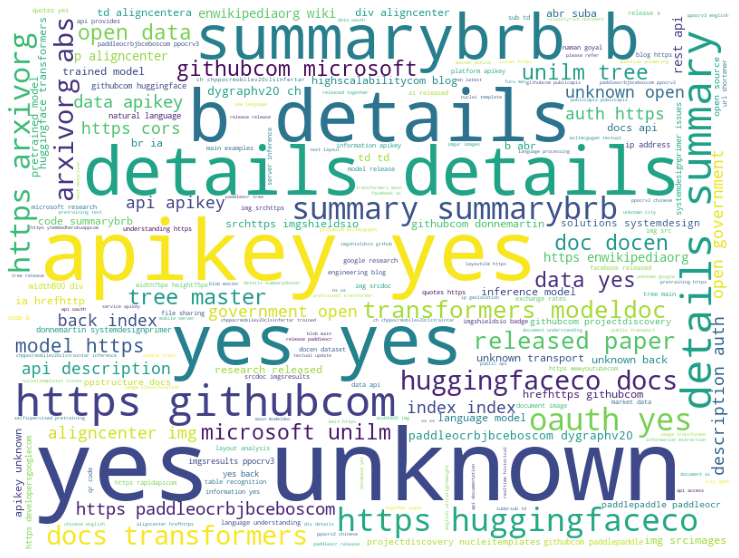

In [37]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

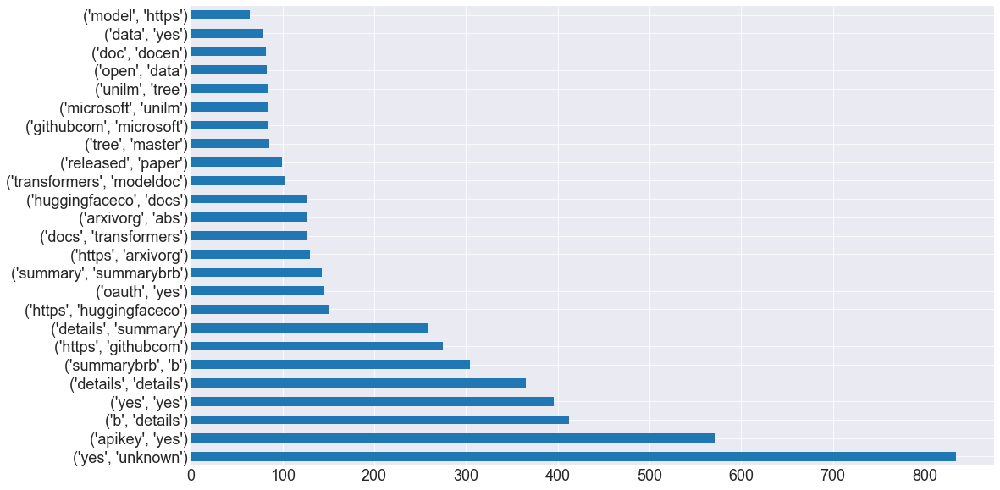

In [38]:
py_bigrams = (pd.Series((nltk.bigrams(py_words.split()))).astype('string'))
py_bigrams.value_counts().head(25).plot.barh()

## JavaScript Words

<AxesSubplot:>

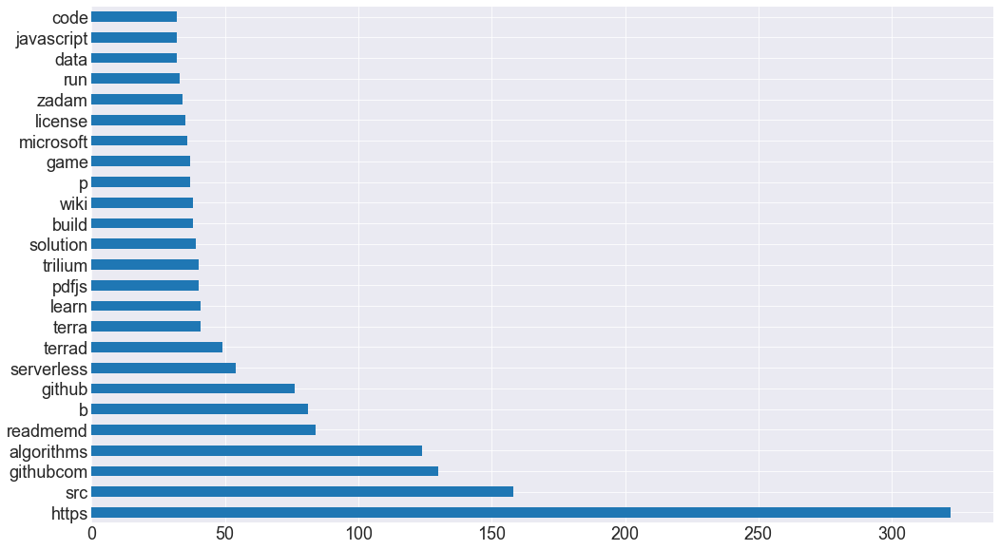

In [39]:
java_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

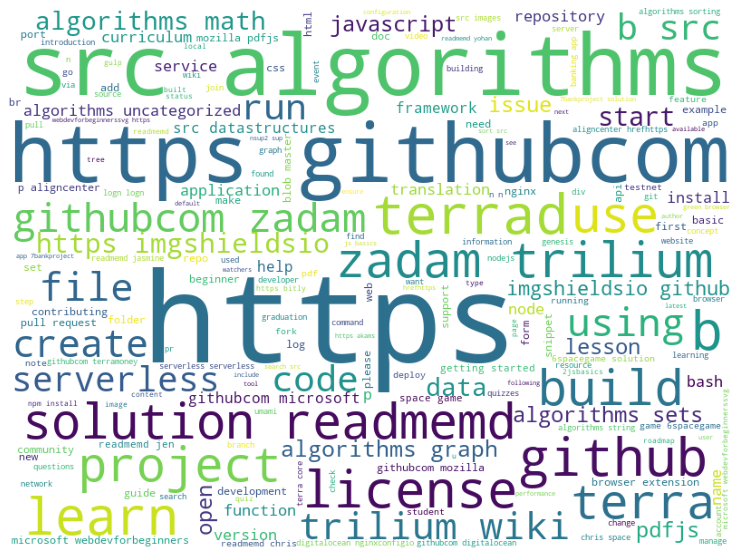

In [40]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

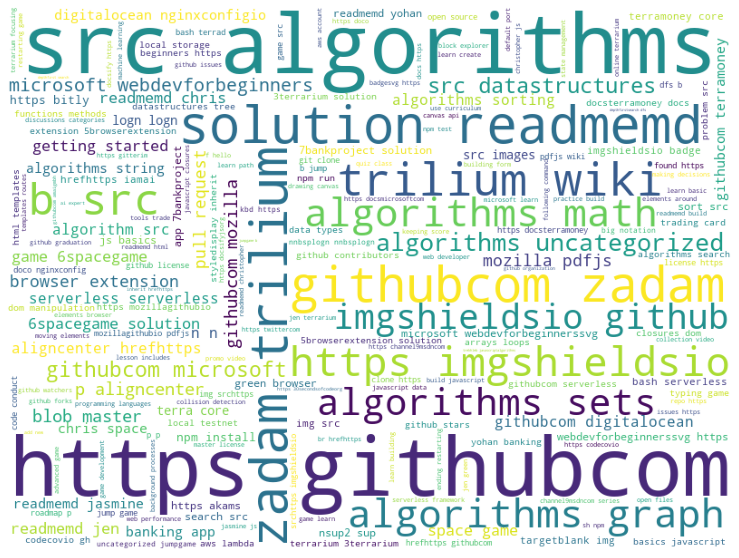

In [41]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

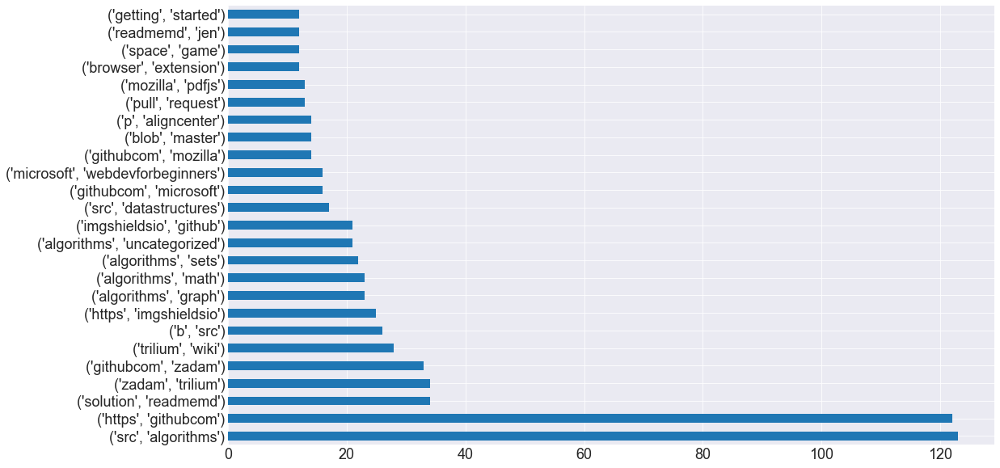

In [42]:
java_bigrams = (pd.Series((nltk.bigrams(java_words.split()))).astype('string'))
java_bigrams.value_counts().head(25).plot.barh()

## HTML Words

<AxesSubplot:>

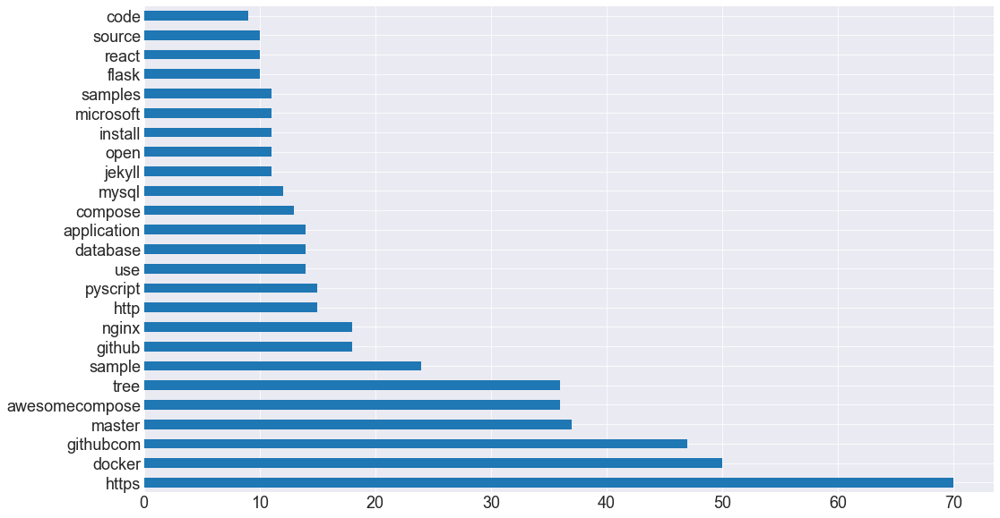

In [43]:
html_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

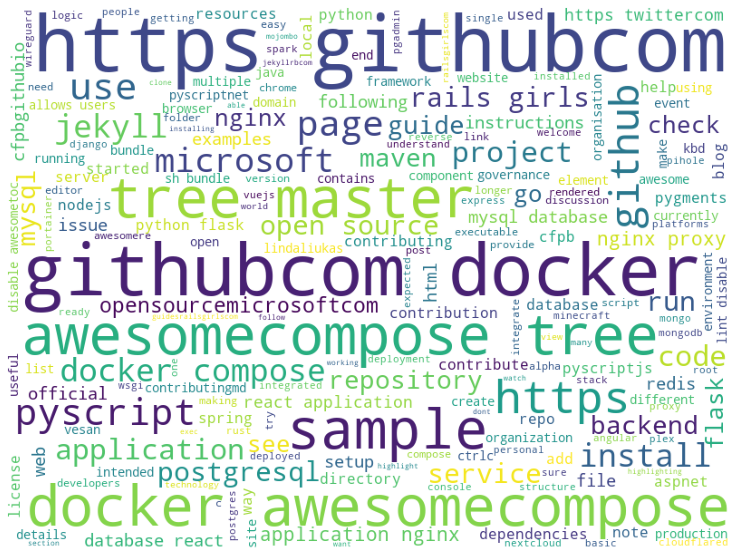

In [44]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

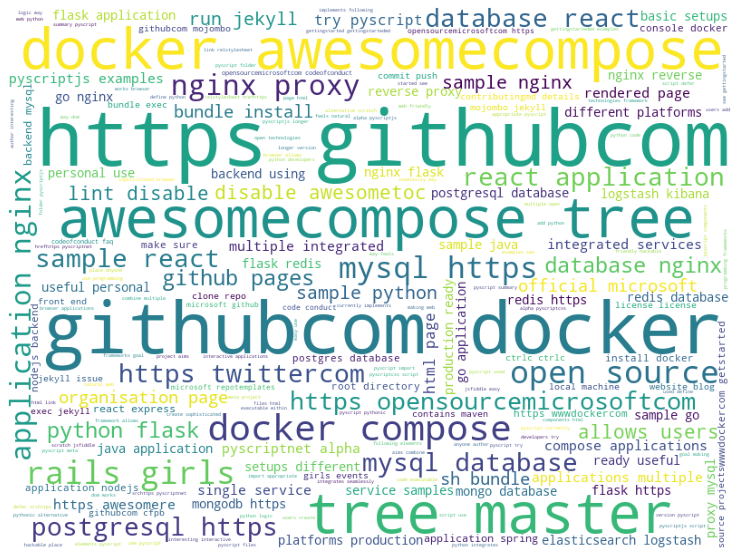

In [45]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

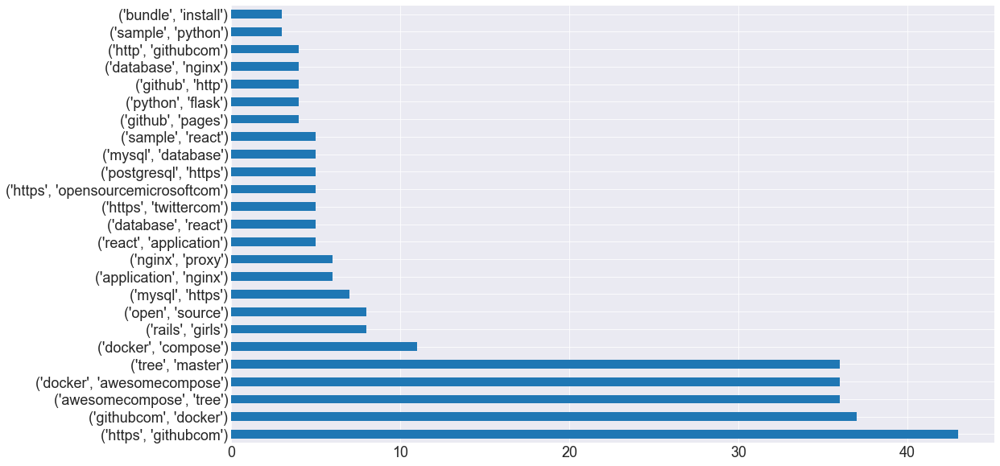

In [46]:
html_bigrams = (pd.Series((nltk.bigrams(html_words.split()))).astype('string'))
html_bigrams.value_counts().head(25).plot.barh()

## TypeScript Words

<AxesSubplot:>

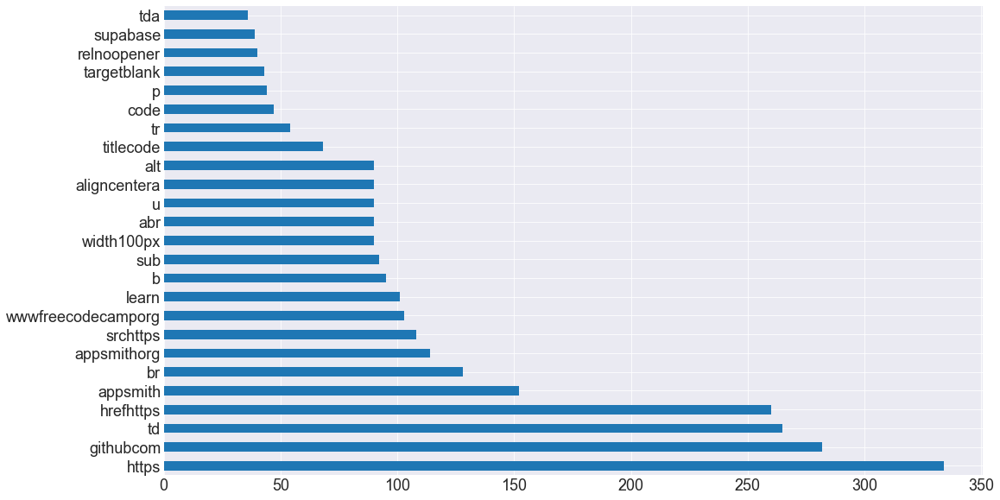

In [47]:
types_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

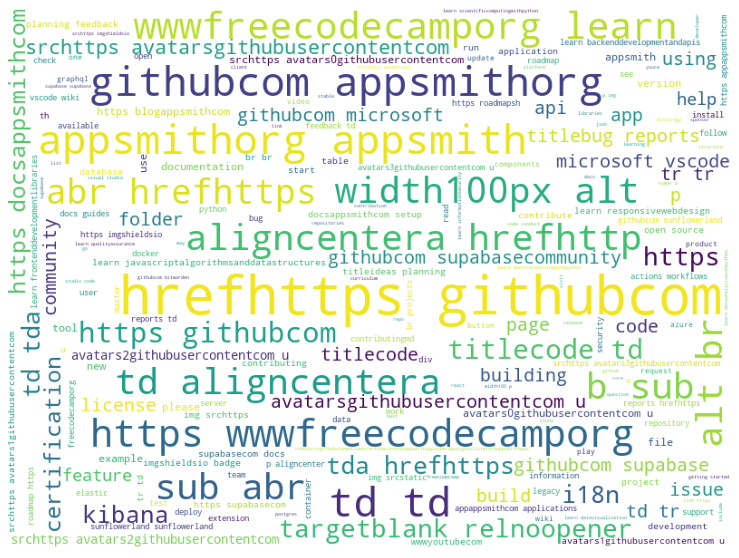

In [48]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

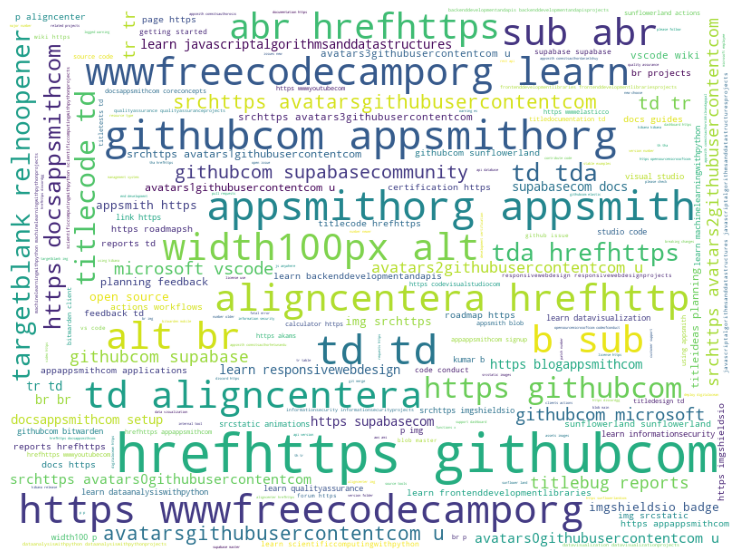

In [49]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

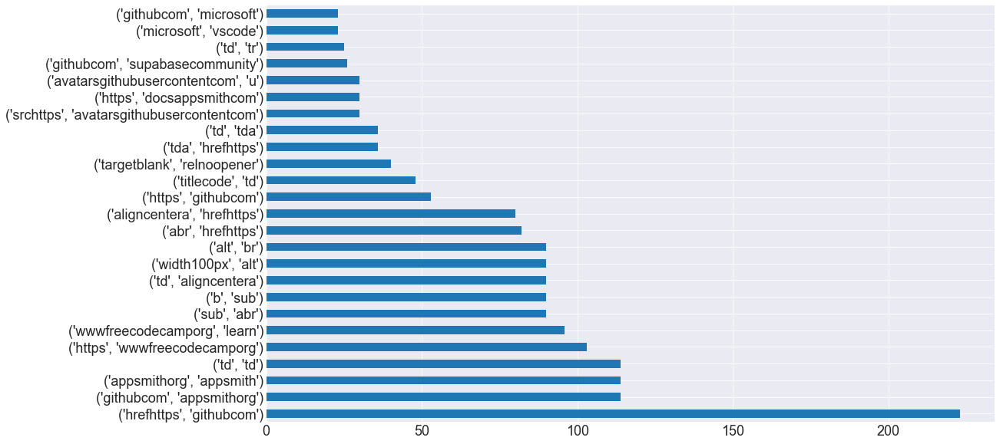

In [50]:
types_bigrams = (pd.Series((nltk.bigrams(types_words.split()))).astype('string'))
types_bigrams.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

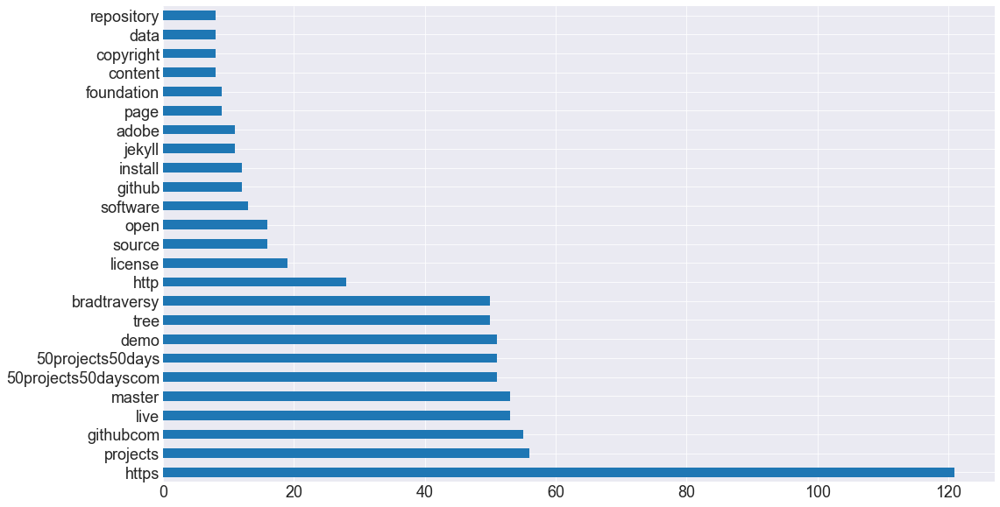

In [51]:
css_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

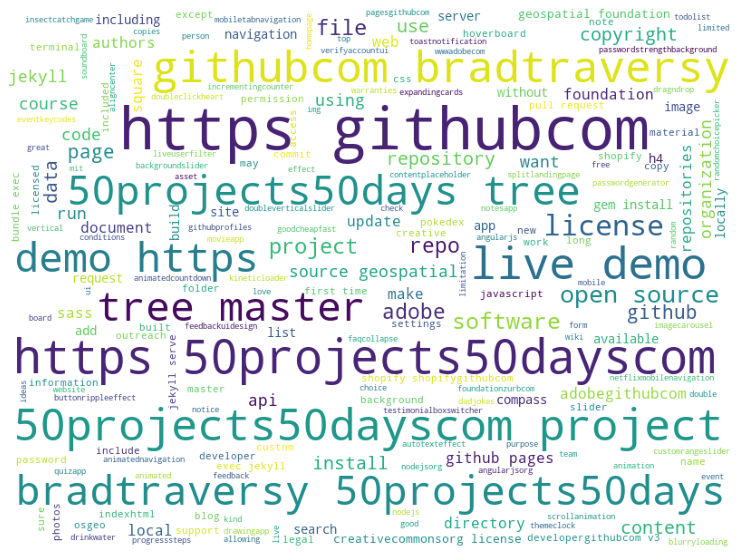

In [52]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

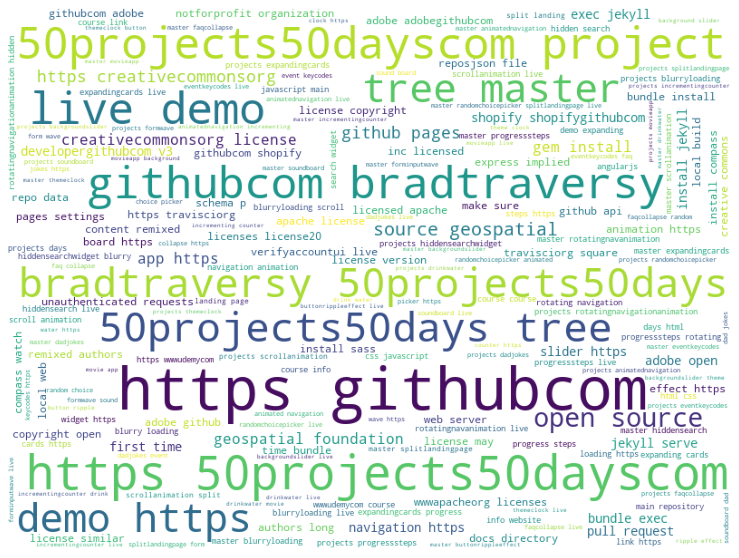

In [53]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

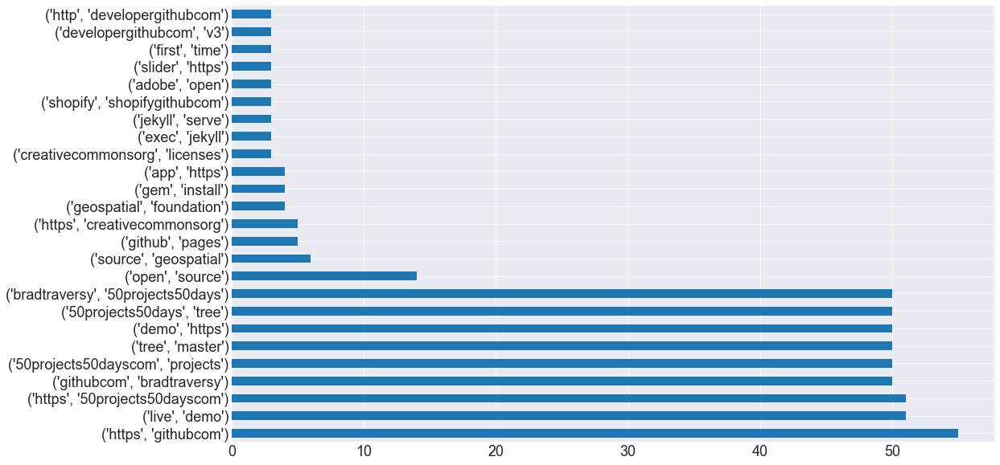

In [54]:
css_bigrams = (pd.Series((nltk.bigrams(css_words.split()))).astype('string'))
css_bigrams.value_counts().head(25).plot.barh()

#### Check the length of the readme

In [55]:
df['message_length'] = df.clean.apply(len)
df['word_count'] = df.clean.apply(str.split).apply(len)
df.head()

,repo,language,original,clean,stemmed,lemmatized,language_reduced,message_length,word_count
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...,Other,3566,434
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...,Python,3559,378
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github stars https imgshieldsio github stars d...,github star http imgshieldsio github star digi...,github star http imgshieldsio github star digi...,JavaScript,4622,523
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logo flutterdev build status cirrus bu...,flutter logo flutterdev build statu cirru buil...,flutter logo flutterdev build status cirrus bu...,Other,4717,562
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...,Python,10832,1203


In [56]:
round(df.message_length.mean(),2)

7445.45

<AxesSubplot:>

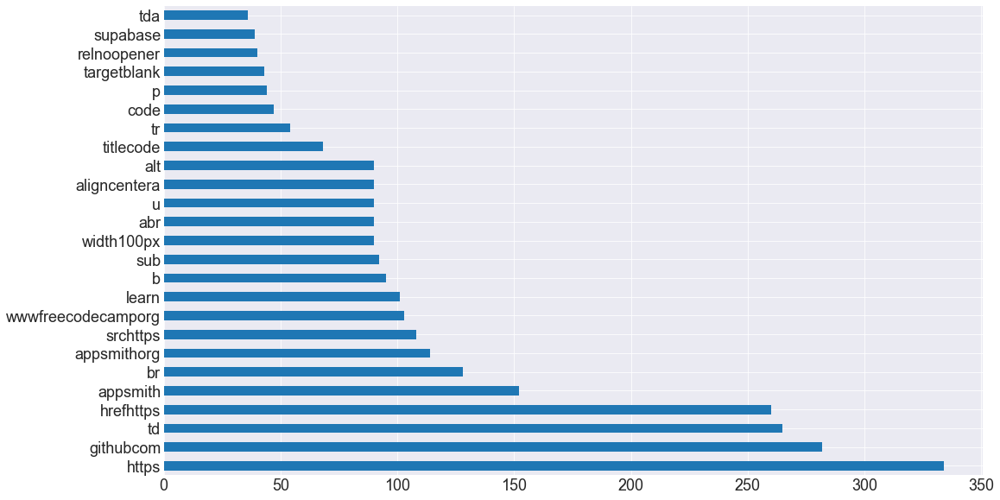

In [57]:
df[['language', 'message_length']].sort_values(by='message_length', ascending=False).head(30)

In [58]:
df[['message_length', 'word_count']][df.language == 'Python']

,message_length,word_count
1,3559,378
4,10832,1203
10,44832,5437
11,410,40
17,19839,2428
25,1355,164
35,3559,378
54,339,46
55,2639,309
61,31184,4099


In [59]:
df[['message_length', 'word_count']][df.language == 'JavaScript']

,message_length,word_count
2,4622,523
13,11647,1423
22,4028,510
23,5219,615
27,5245,580
29,9607,1105
33,2607,306
74,1931,247
75,1363,182
87,4426,400


In [60]:
df[['message_length', 'word_count']][df.language == 'HTML']

,message_length,word_count
26,1526,188
39,5626,661
76,1968,265
97,1319,180
98,43,6
102,601,77
106,1415,149
112,25,3


In [61]:
df[['message_length', 'word_count']][df.language == 'TypeScript']

,message_length,word_count
5,9588,1099
12,3155,383
19,2612,338
40,2381,277
42,19196,1870
44,5219,594
56,5878,424
57,19196,1870
78,16006,1344
86,3000,346


In [62]:
df[['message_length', 'word_count']][df.language == 'CSS']

,message_length,word_count
73,8847,963
95,2160,284
100,1744,223
104,1859,246
108,2195,262
110,166,19
111,164,25


## Lemmatized

In [63]:
py_words_l = ' '.join(df[df.language == 'Python'].lemmatized)
java_words_l = ' '.join(df[df.language == 'JavaScript'].lemmatized)
html_words_l = ' '.join(df[df.language == 'HTML'].lemmatized)
types_words_l = ' '.join(df[df.language == 'TypeScript'].lemmatized)
css_words_l = ' '.join(df[df.language == 'CSS'].lemmatized)
all_words_l = ' '.join(df.lemmatized)

In [64]:
py_words_l[:1000]

'h1 aligncenter nucleus template h1 h4 aligncentercommunity curated list template nucleus engine find security vulnerability application h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq template faq hrefhttps discordgg projectdiscoveryjoin discord p template core nucleus scanner http githubcom projectdiscovery nucleus power actual scanning engine repository store h

In [65]:
java_words_l[:1000]

'github star http imgshieldsio github star digitalocean nginxconfigiosvg http githubcom digitalocean nginxconfigio stargazer github contributor http imgshieldsio github contributor digitalocean nginxconfigiosvgcolorblue http githubcom digitalocean nginxconfigio graph contributor mit license http imgshieldsio github license digitalocean nginxconfigiosvgcolorblue http githubcom digitalocean nginxconfigio blob master license br closed issue http imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreen http githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed pr http imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreen http githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issue http imgshieldsio github issuesraw digitalocean nginxconfigiosvg http githubcom digitalocean nginxconfigio issue open pr http imgshieldsio github issuesprraw digitalocean nginxconfigiosvg http githubcom digitalocean nginxconfig

In [66]:
html_words_l[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming framework goal making web friendly hackable place anyone author interesting interactive application get started see gettingstarted gettingstartedmd example see pyscript folder pyscriptjs longer version pyscript meta project aim combine multiple open technology framework allows user create sophisticated browser application python integrates seamlessly way dom work browser allows user add python logic way feel natural web python developer try pyscript try pyscript import appropriate pyscript file html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript component html page pyscript currently implement following element pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows user write executable code check 

In [67]:
types_words_l[:1000]

'p aligncenter img width300 srchttps rawgithubusercontentcom supabase supabase master web static supabaselightroundedcornerbackgroundsvg p supabase supabase http supabasecom open source firebase alternative building feature firebase using enterprisegrade open source tool x hosted postgres database doc http supabasecom doc guide database x authentication authorization doc http supabasecom doc guide auth x autogenerated apis x rest doc http supabasecom doc guide apirestapi x realtime subscription doc http supabasecom doc guide apirealtimeapi x graphql beta doc http supabasecom doc guide apigraphqlapi x function x database function doc http supabasecom doc guide database function x edge function doc http supabasecom doc guide function x file storage doc http supabasecom doc guide storage x dashboard supabase dashboard http rawgithubusercontentcom supabase supabase master apps www public image github supabasedashboardpng documentation full documentation visit supabasecom doc http supabasec

In [68]:
css_words_l[:1000]

'50 project 50 day html cs javascript main repository project course course link http wwwudemycom course 50projects50days course info website http 50projects50dayscom project live demo 01 expanding card http githubcom bradtraversy 50projects50days tree master expandingcards live demo http 50projects50dayscom project expandingcards 02 progress step http githubcom bradtraversy 50projects50days tree master progresssteps live demo http 50projects50dayscom project progresssteps 03 rotating navigation animation http githubcom bradtraversy 50projects50days tree master rotatingnavanimation live demo http 50projects50dayscom project rotatingnavigationanimation 04 hidden search widget http githubcom bradtraversy 50projects50days tree master hiddensearch live demo http 50projects50dayscom project hiddensearchwidget 05 blurry loading http githubcom bradtraversy 50projects50days tree master blurryloading live demo http 50projects50dayscom project blurryloading 06 scroll animation http githubcom bra

In [69]:
all_words_l[:1000]

'googletest announcement live head googletest follows abseil live head philosophy http abseilio philosophyupgradesupport recommend updating latest commit main branch often possible http githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation update documentation live github page http googlegithubio googletest recommend browsing documentation github page rather directly repository release 1110 release 1110 http githubcom google googletest release tag release1110 available coming soon planning take dependency abseil http githubcom abseil abseilcpp documentation improvement planned welcome googletest google c test framework repository merger formerly separate googletest googlemock project closely related make sense maintain release together getting started see googletest user guide http googlegithubio googletest documentation recommend starting googletest primer http googlegithubio googletest primerhtml information building googletest found googletest readm

In [70]:
py_freq_l = pd.Series(py_words_l.split()).value_counts()
java_freq_l = pd.Series(java_words_l.split()).value_counts()
html_freq_l = pd.Series(html_words_l.split()).value_counts()
types_freq_l = pd.Series(types_words_l.split()).value_counts()
css_freq_l = pd.Series(css_words_l.split()).value_counts()
all_freq_l = pd.Series(all_words_l.split()).value_counts()


In [71]:
py_freq_l

http                     2415
yes                      1734
unknown                   913
detail                    856
api                       596
                         ... 
wwwvarnishcacheorg          1
varnish                     1
q6z24lapng                  1
sqlvsnosqldifferences       1
yandexweather               1
Length: 9523, dtype: int64

In [72]:
java_freq_l

http         348
src          158
algorithm    135
githubcom    130
readmemd      84
            ... 
stage          1
multiple       1
builtin        1
minimal        1
file2          1
Length: 2334, dtype: int64

In [73]:
html_freq_l

http                  85
docker                50
githubcom             47
master                37
awesomecompose        36
                      ..
author                 1
interesting            1
railsgirlsgithubio     1
cd                     1
didi                   1
Length: 580, dtype: int64

In [74]:
types_freq_l

http          339
githubcom     282
td            265
hrefhttps     260
appsmith      152
             ... 
document        1
cover           1
authorized      1
broadcast       1
detail          1
Length: 2088, dtype: int64

In [75]:
css_freq_l

http          149
project        63
githubcom      55
live           53
master         53
             ... 
popularity      1
last            1
push            1
select          1
need            1
Length: 804, dtype: int64

In [76]:
all_freq_l

http                   4594
yes                    1758
githubcom              1255
unknown                 913
detail                  882
                       ... 
bamboo                    1
teamcity                  1
slave                     1
namejenkinsadvanced       1
didi                      1
Length: 17855, dtype: int64

In [77]:
word_counts_l = pd.concat([py_freq_l, java_freq_l, html_freq_l, types_freq_l, css_freq_l, all_freq_l], axis=1).fillna(0).astype(int)
word_counts_l.columns = ['python', 'java', 'html', 'typescript', 'css', 'all']

In [78]:
word_counts_l

,python,java,html,typescript,css,all
http,2415,348,85,339,149,4594
yes,1734,2,0,0,0,1758
unknown,913,0,0,0,0,913
detail,856,4,3,1,0,882
api,596,16,0,21,6,697
...,...,...,...,...,...,...
tetrisv,0,0,0,0,0,1
sokol,0,0,0,0,0,1
gg,0,0,0,0,0,1
libxidev,0,0,0,0,0,1


In [79]:
word_counts_l.sort_values('python', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,4594
yes,1734,2,0,0,0,1758
unknown,913,0,0,0,0,913
detail,856,4,3,1,0,882
api,596,16,0,21,6,697
apikey,595,0,0,0,0,595
b,455,81,0,95,1,688
summarybrb,400,0,0,0,0,400
doc,395,22,1,30,2,587
data,376,32,0,14,8,480


In [80]:
word_counts_l.sort_values('java', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,4594
src,13,158,0,3,0,215
algorithm,18,135,0,4,0,159
githubcom,306,130,47,282,55,1255
readmemd,55,84,1,3,1,210
b,455,81,0,95,1,688
github,25,76,18,15,12,255
serverless,0,54,0,0,0,56
terrad,0,49,0,0,0,49
set,14,42,1,5,1,92


In [81]:
word_counts_l.sort_values('html', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,4594
docker,28,5,50,10,0,143
githubcom,306,130,47,282,55,1255
master,103,19,37,16,53,327
tree,111,14,36,1,50,269
awesomecompose,0,0,36,0,0,36
sample,5,2,35,2,0,59
application,17,17,20,23,0,113
nginx,3,12,18,0,0,34
github,25,76,18,15,12,255


In [82]:
word_counts_l.sort_values('typescript', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,4594
githubcom,306,130,47,282,55,1255
td,52,0,0,265,0,326
hrefhttps,68,29,1,260,0,401
appsmith,0,0,0,152,0,152
br,99,13,0,128,0,254
appsmithorg,0,0,0,114,0,114
srchttps,45,10,1,108,1,217
wwwfreecodecamporg,0,0,0,103,0,103
learn,6,41,1,101,1,186


In [83]:
word_counts_l.sort_values('css', ascending=False).head(25)

,python,java,html,typescript,css,all
http,2415,348,85,339,149,4594
project,41,33,9,26,63,316
githubcom,306,130,47,282,55,1255
live,13,1,0,2,53,75
master,103,19,37,16,53,327
demo,6,2,0,2,51,69
50projects50days,0,0,0,0,51,51
50projects50dayscom,0,0,0,0,51,51
tree,111,14,36,1,50,269
bradtraversy,0,0,0,0,50,50


In [84]:
# set up some basic matplotlib style parameters
plt.rc('figure', figsize=(17, 10))
plt.style.use('seaborn-darkgrid')
plt.rc('font', size=18)

Text(0.5, 1.0, 'Top 25 Most Frequent Overall lemmatized Words')

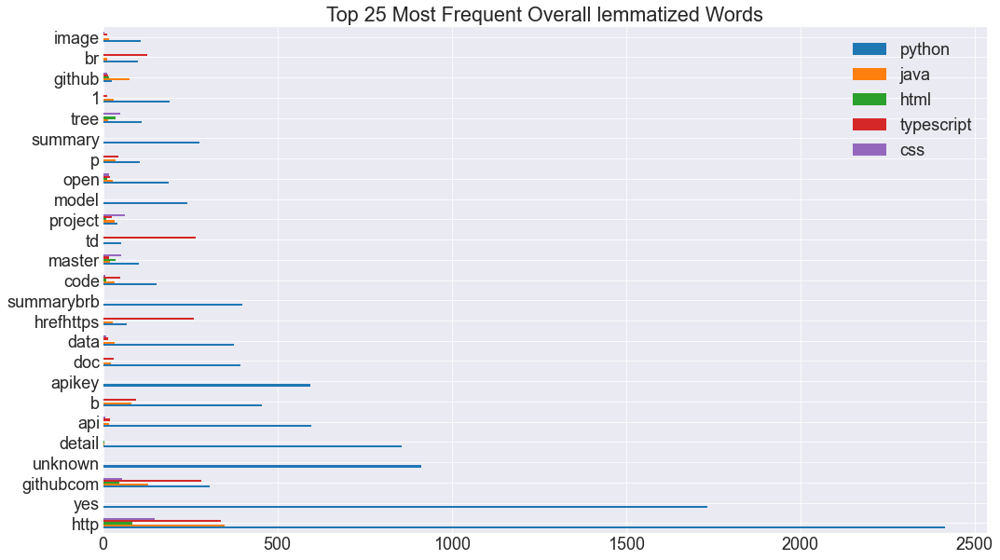

In [85]:
word_counts_l.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'typescript', 'css']].plot.barh()
plt.title('Top 25 Most Frequent Overall lemmatized Words')

## Lemmatized Python words

<AxesSubplot:>

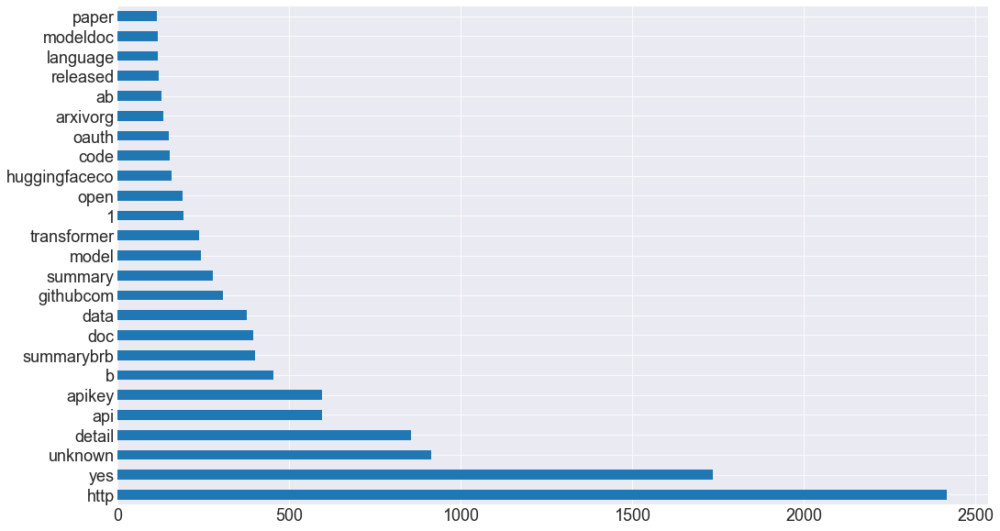

In [86]:
py_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

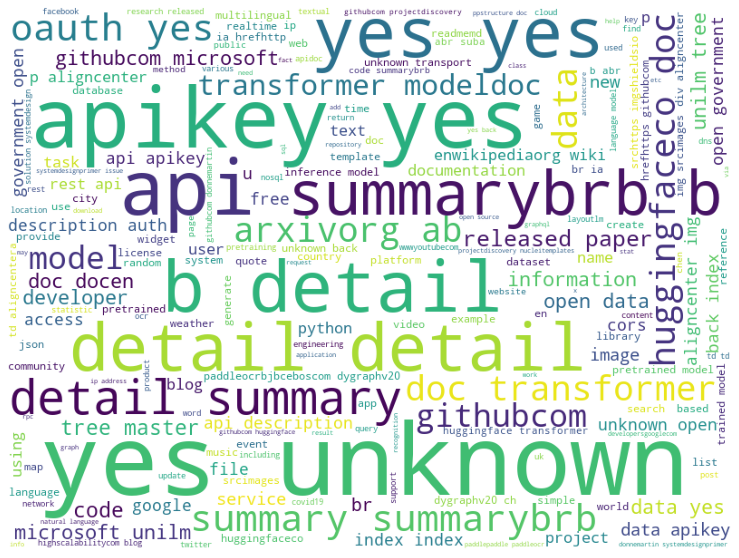

In [87]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

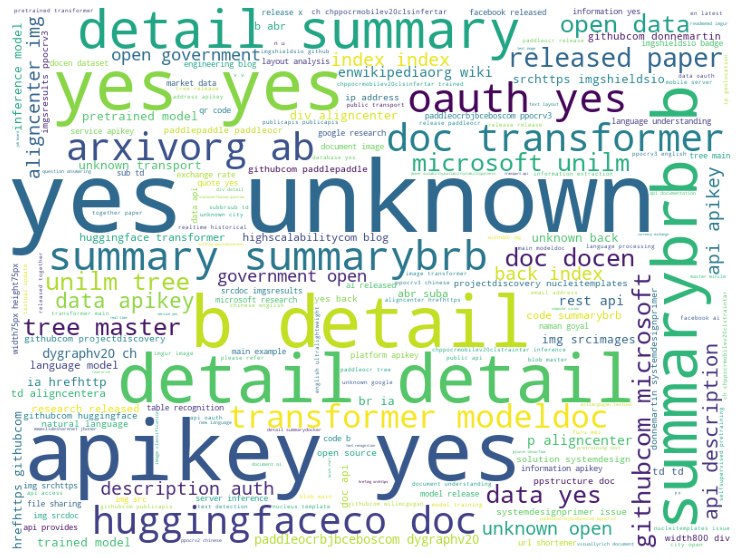

In [88]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

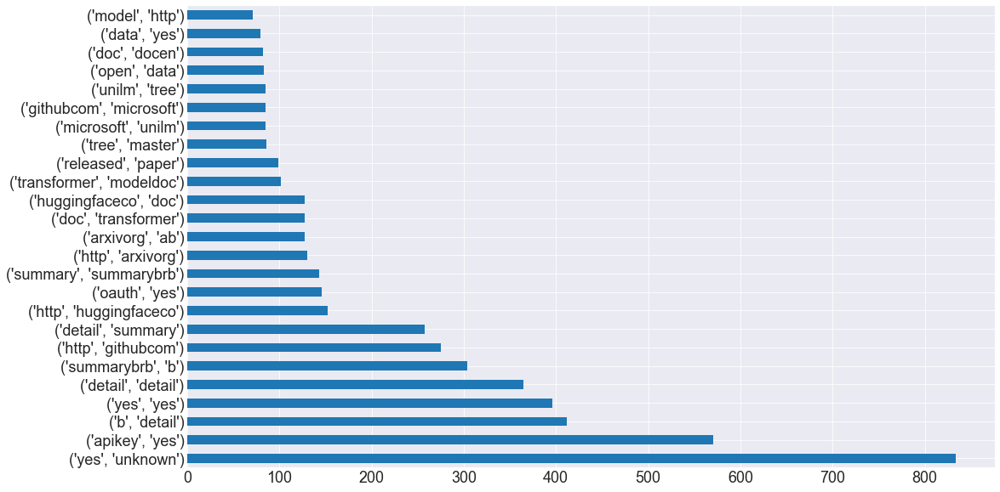

In [89]:
py_bigrams_l = (pd.Series((nltk.bigrams(py_words_l.split()))).astype('string'))
py_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized JavaScript Words

<AxesSubplot:>

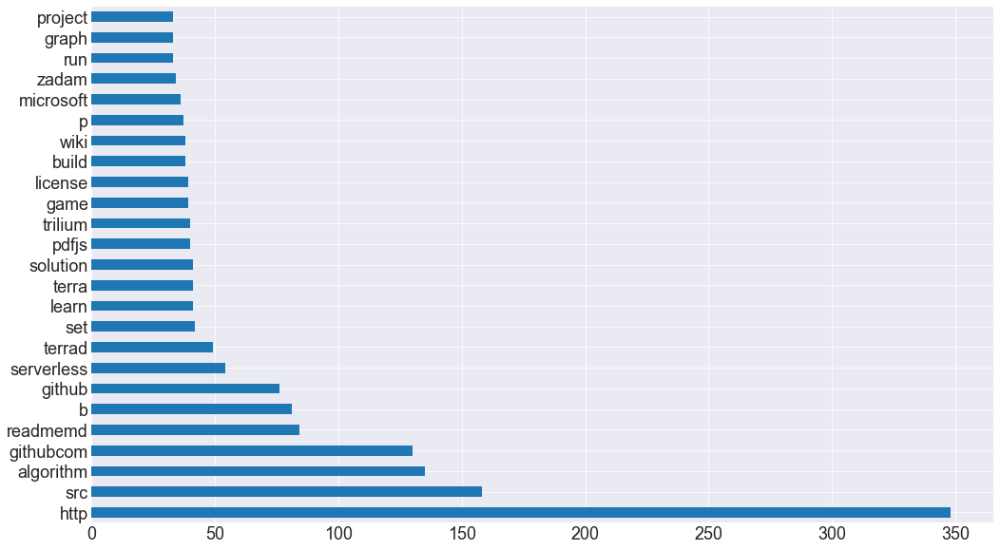

In [90]:
java_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

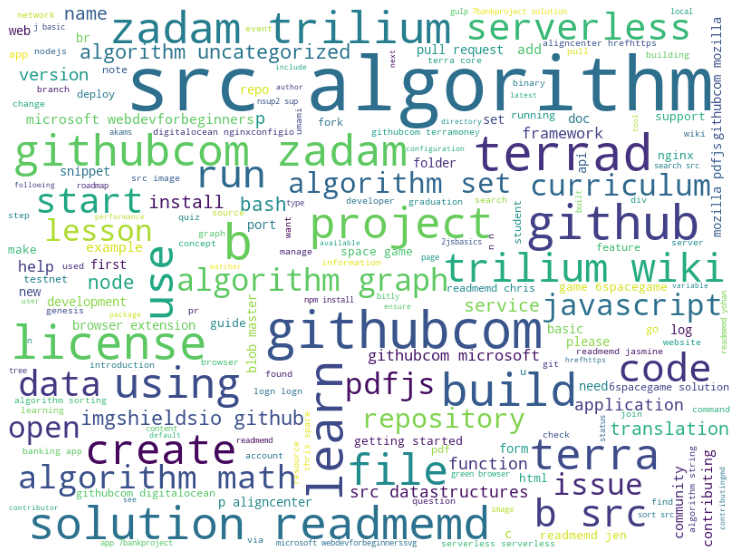

In [91]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

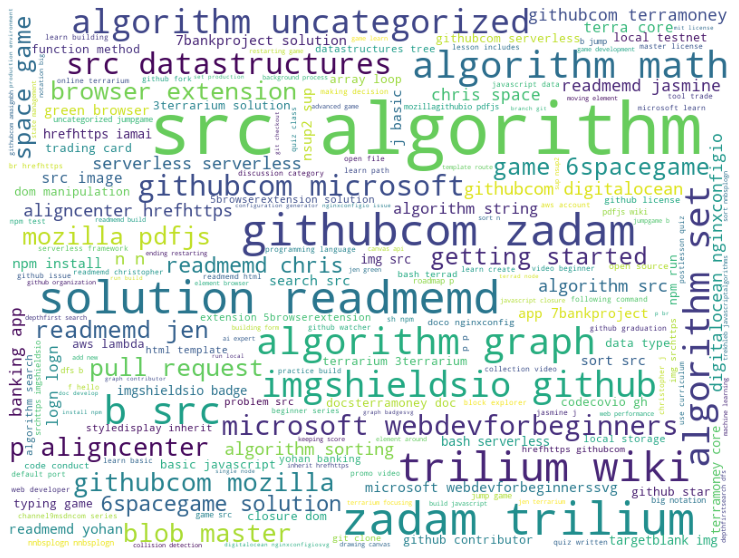

In [92]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

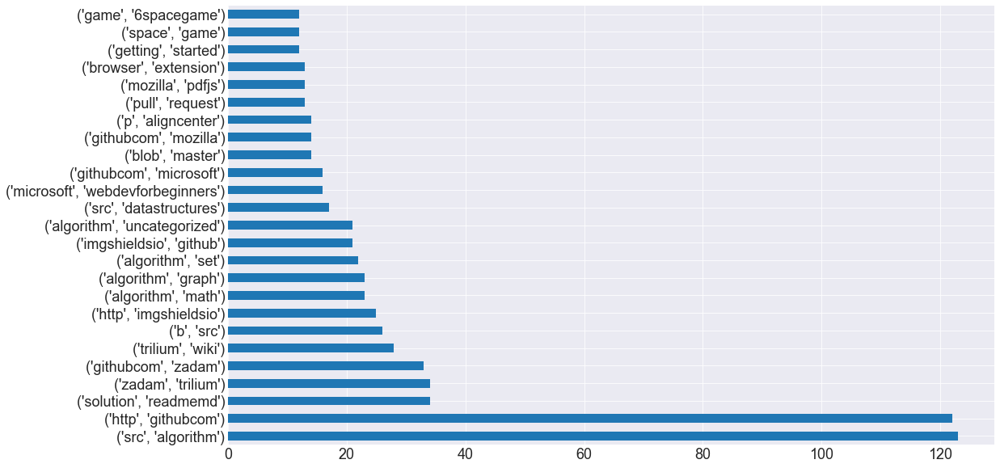

In [93]:
java_bigrams_l = (pd.Series((nltk.bigrams(java_words_l.split()))).astype('string'))
java_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized HTML Words

<AxesSubplot:>

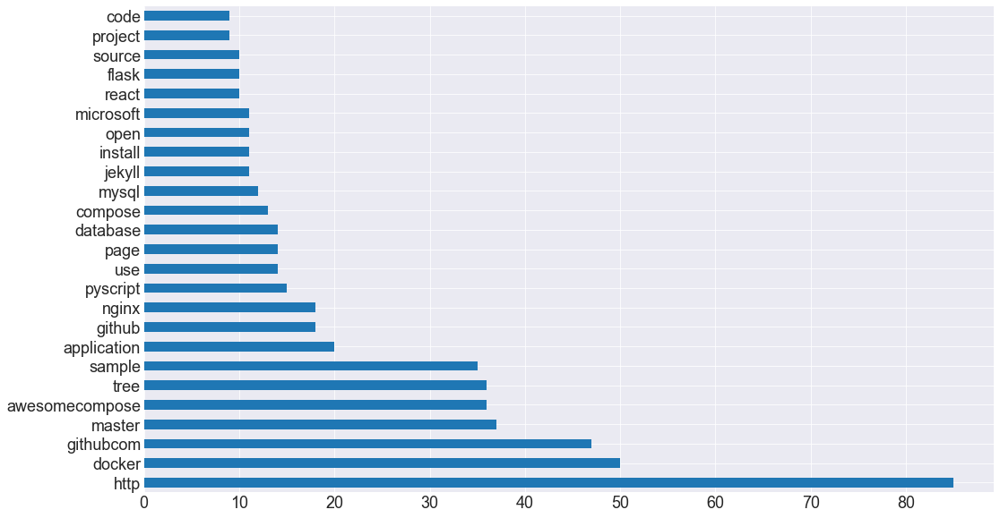

In [94]:
html_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

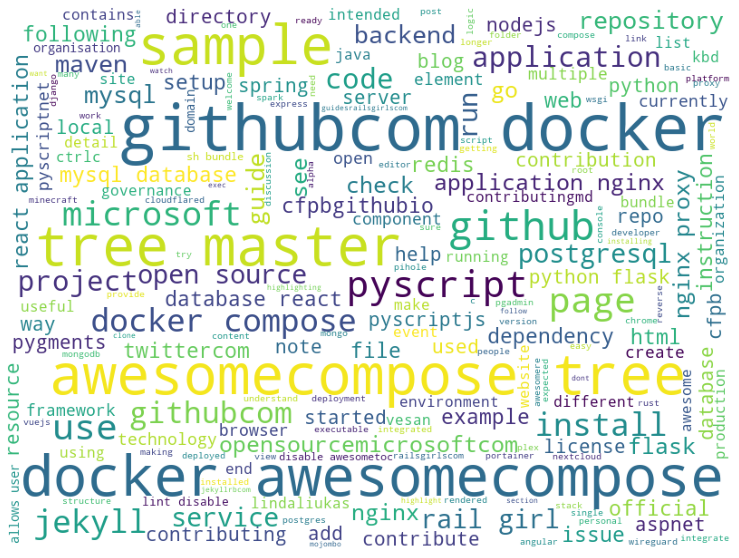

In [95]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

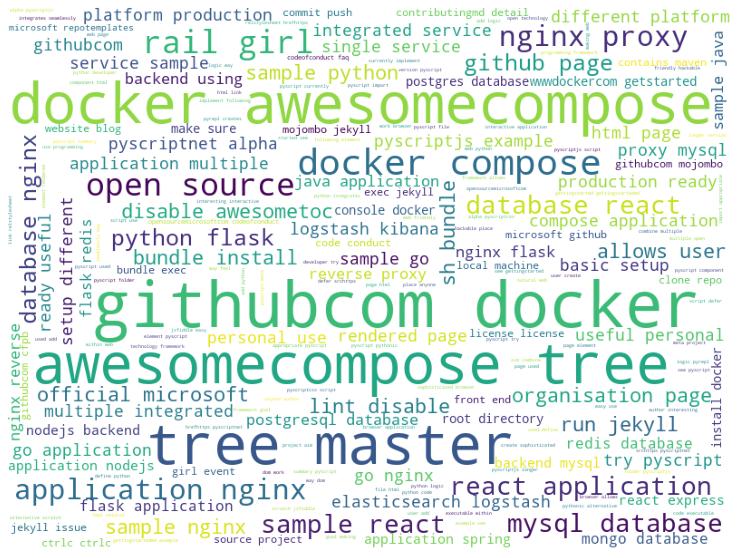

In [96]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

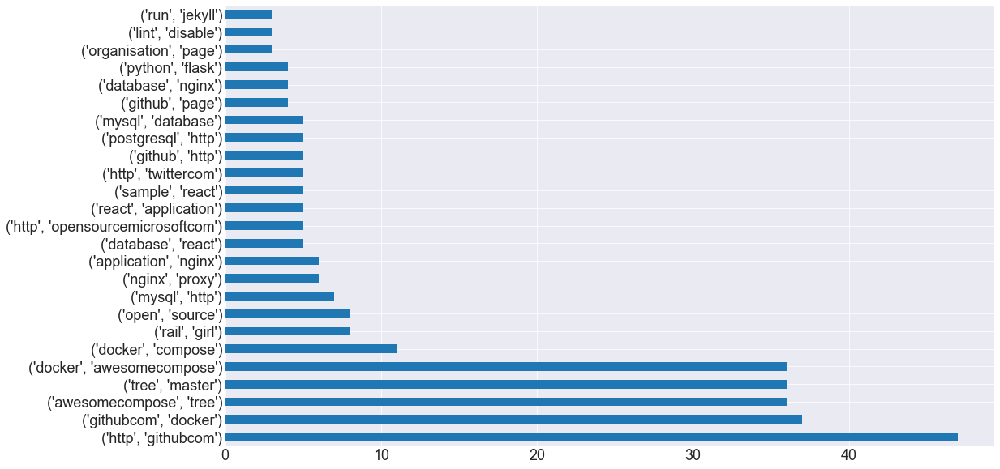

In [97]:
html_bigrams_l = (pd.Series((nltk.bigrams(html_words_l.split()))).astype('string'))
html_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized TypeScript Words

<AxesSubplot:>

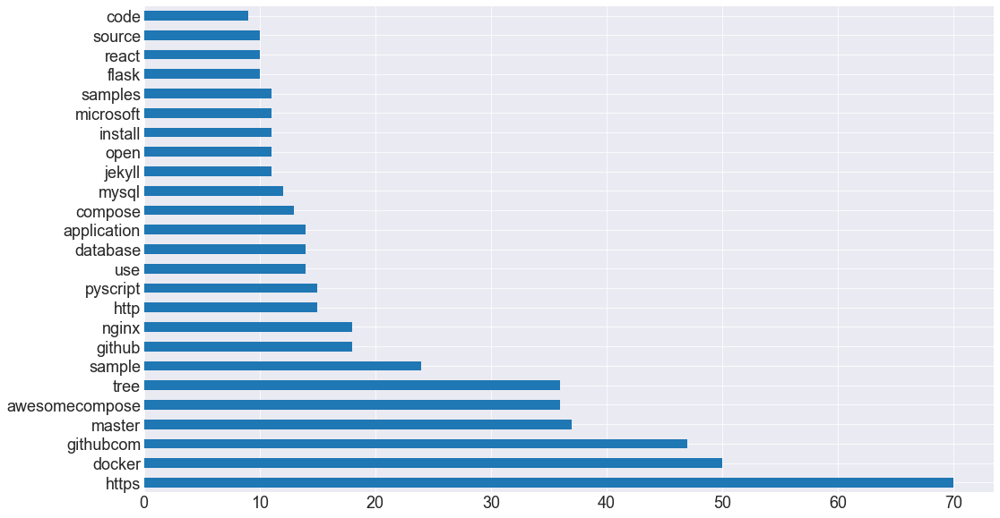

In [98]:
types_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

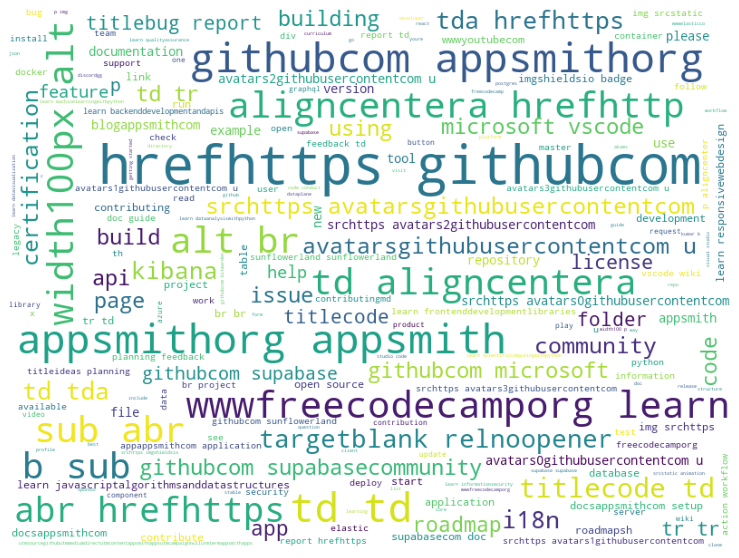

In [99]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

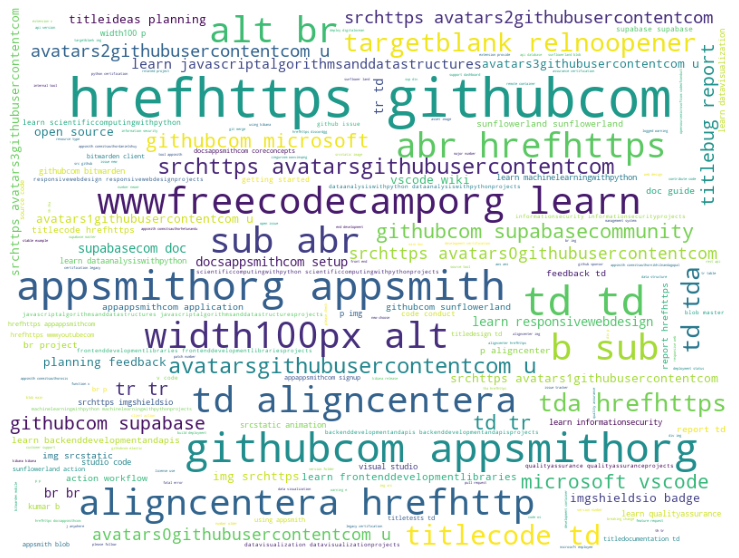

In [100]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

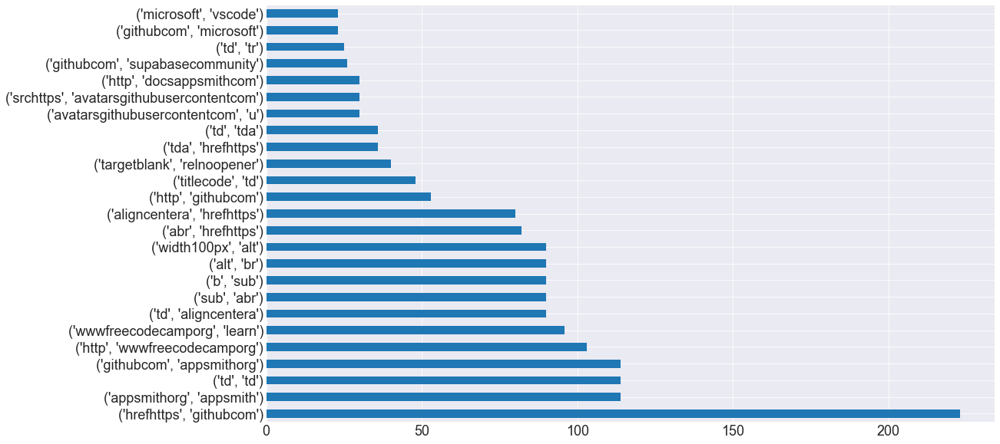

In [101]:
types_bigrams_l = (pd.Series((nltk.bigrams(types_words_l.split()))).astype('string'))
types_bigrams_l.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

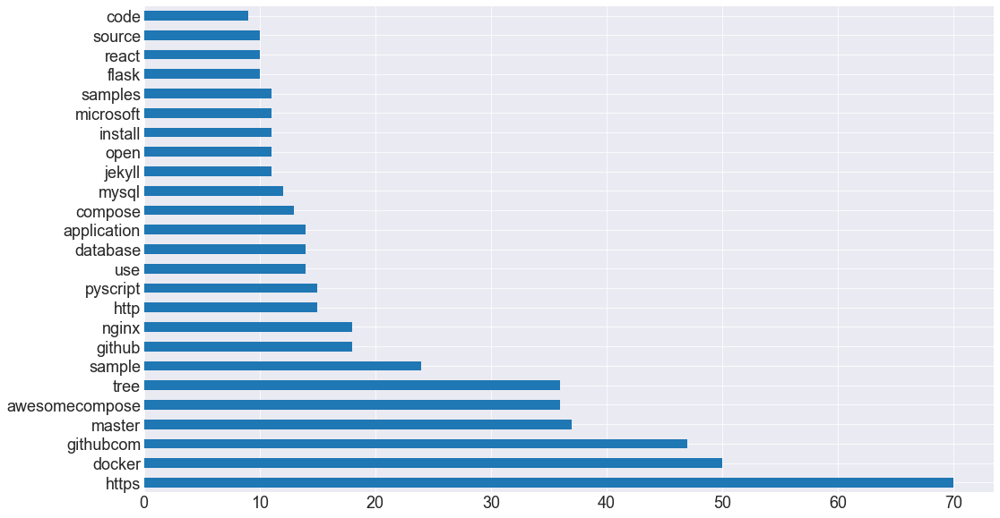

In [102]:
css_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

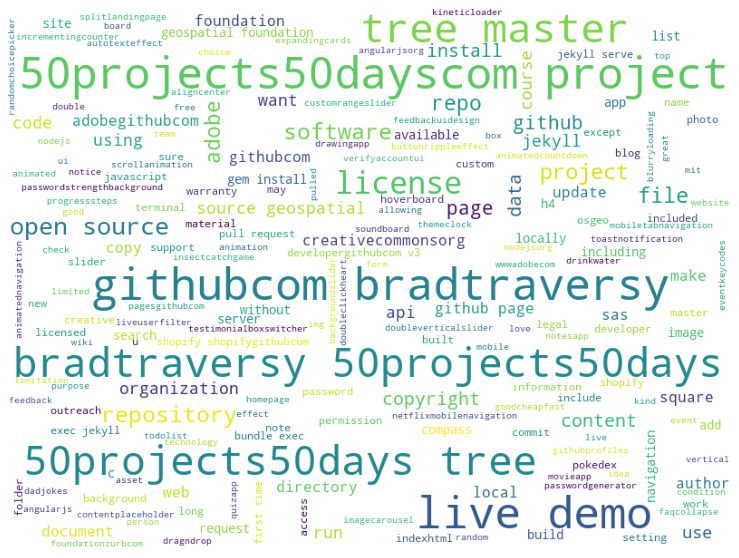

In [103]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

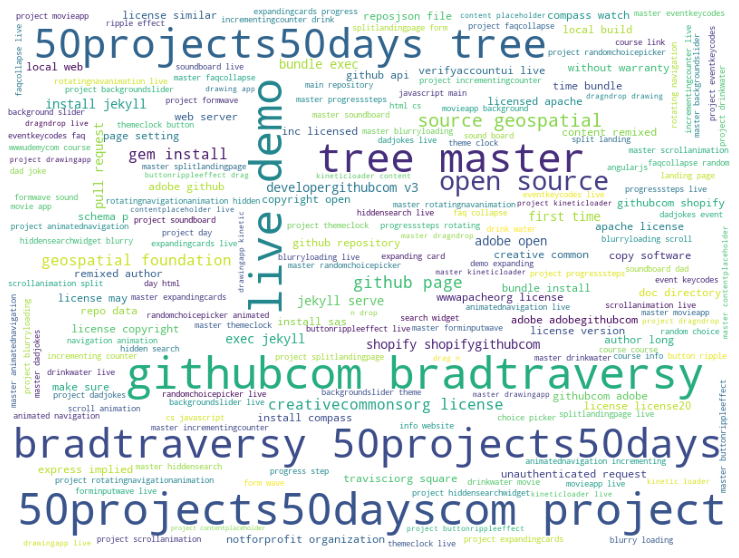

In [104]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

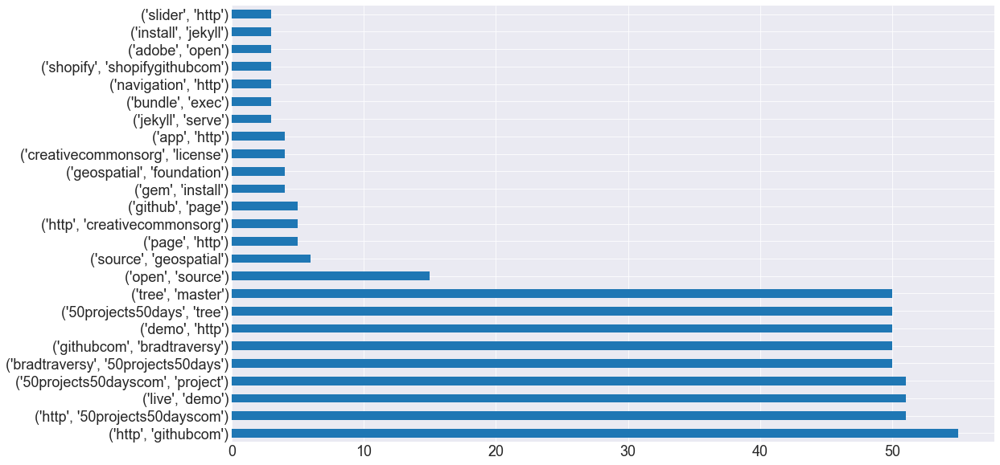

In [105]:
css_bigrams_l = (pd.Series((nltk.bigrams(css_words_l.split()))).astype('string'))
css_bigrams_l.value_counts().head(25).plot.barh()

## Reduce the languages to four categories:
- JavaScript
- HTML
- Python
- Other

In [109]:
df.language_reduced.value_counts()

Other         61
Python        15
JavaScript    15
HTML           8
Name: language_reduced, dtype: int64

In [110]:
py_words1 = ' '.join(df[df.language_reduced == 'Python'].clean)
java_words1 = ' '.join(df[df.language_reduced == 'JavaScript'].clean)
html_words1 = ' '.join(df[df.language_reduced == 'HTML'].clean)
other_words1 = ' '.join(df[df.language_reduced == 'Other'].clean)
all_words = ' '.join(df.clean)

In [111]:
py_words1[:1000]

'h1 aligncenter nuclei templates h1 h4 aligncentercommunity curated list templates nuclei engine find security vulnerabilities applications h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq templates faqs hrefhttps discordgg projectdiscoveryjoin discord p templates core nuclei scanner https githubcom projectdiscovery nuclei powers actual scanning engine repository s

In [112]:
java_words1[:1000]

'github stars https imgshieldsio github stars digitalocean nginxconfigiosvg https githubcom digitalocean nginxconfigio stargazers github contributors https imgshieldsio github contributors digitalocean nginxconfigiosvgcolorblue https githubcom digitalocean nginxconfigio graphs contributors mit license https imgshieldsio github license digitalocean nginxconfigiosvgcolorblue https githubcom digitalocean nginxconfigio blob master license br closed issues https imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreen https githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed pr https imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreen https githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issues https imgshieldsio github issuesraw digitalocean nginxconfigiosvg https githubcom digitalocean nginxconfigio issues open pr https imgshieldsio github issuesprraw digitalocean nginxconfigiosvg https githubcom 

In [113]:
html_words1[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming frameworks goal making web friendly hackable place anyone author interesting interactive applications get started see gettingstarted gettingstartedmd examples see pyscript folder pyscriptjs longer version pyscript meta project aims combine multiple open technologies framework allows users create sophisticated browser applications python integrates seamlessly way dom works browser allows users add python logic way feels natural web python developers try pyscript try pyscript import appropriate pyscript files html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript components html page pyscript currently implements following elements pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows users write execu

In [114]:
other_words1[:1000]

'googletest announcements live head googletest follows abseil live head philosophy https abseilio philosophyupgradesupport recommend updating latest commit main branch often possible https githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation updates documentation live github pages https googlegithubio googletest recommend browsing documentation github pages rather directly repository release 1110 release 1110 https githubcom google googletest releases tag release1110 available coming soon planning take dependency abseil https githubcom abseil abseilcpp documentation improvements planned welcome googletest googles c test framework repository merger formerly separate googletest googlemock projects closely related makes sense maintain release together getting started see googletest users guide https googlegithubio googletest documentation recommend starting googletest primer https googlegithubio googletest primerhtml information building googletest found

In [117]:
py_freq1 = pd.Series(py_words1.split()).value_counts()
java_freq1 = pd.Series(java_words1.split()).value_counts()
html_freq1 = pd.Series(html_words1.split()).value_counts()
other_freq1 = pd.Series(other_words1.split()).value_counts()
all_freq_l = pd.Series(all_words.split()).value_counts()

In [119]:
word_counts1 = pd.concat([py_freq1, java_freq1, html_freq1, other_freq1, all_freq_l], axis=1).fillna(0).astype(int)
word_counts1.columns = ['python', 'java', 'html', 'other', 'all']

In [121]:
word_counts1.head(25)

,python,java,html,other,all
https,2112,322,70,1584,4088
yes,1734,2,0,22,1758
unknown,913,0,0,0,913
details,855,1,3,18,877
api,596,16,0,85,697
apikey,595,0,0,0,595
b,455,81,0,151,687
summarybrb,400,0,0,0,400
data,376,32,0,72,480
githubcom,306,130,47,772,1255


Text(0.5, 1.0, 'Top 25 Most Frequent Overall lemmatized Words')

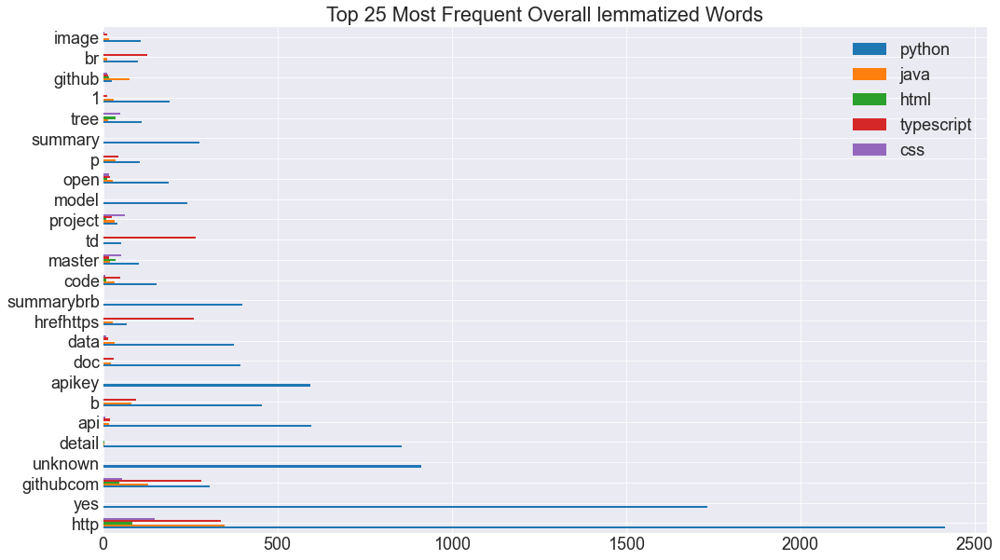

In [ ]:
word_counts1.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'other']].plot.barh()
plt.title('Top 25 Most Frequent Overall lemmatized Words')

## Lemmatized Python words

<AxesSubplot:>

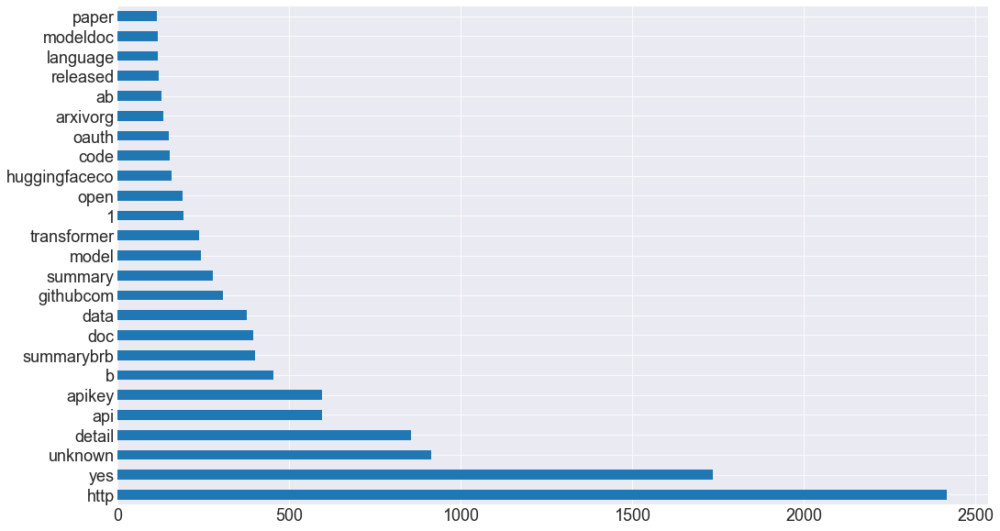

In [ ]:
py_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

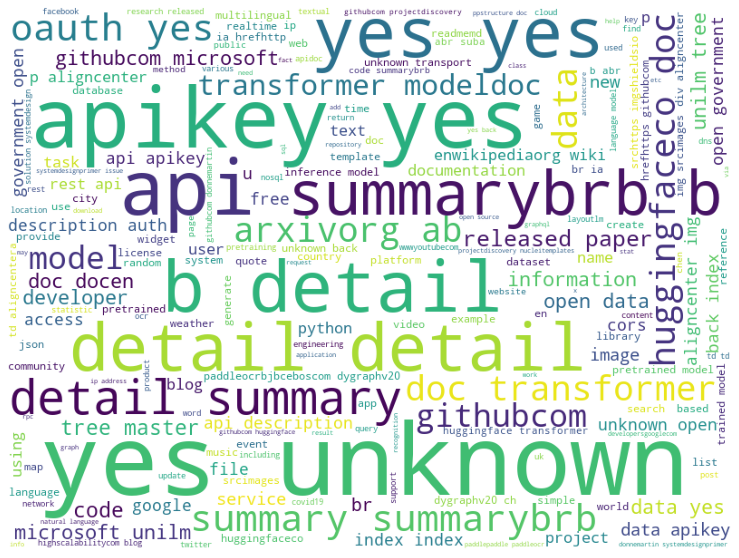

In [ ]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

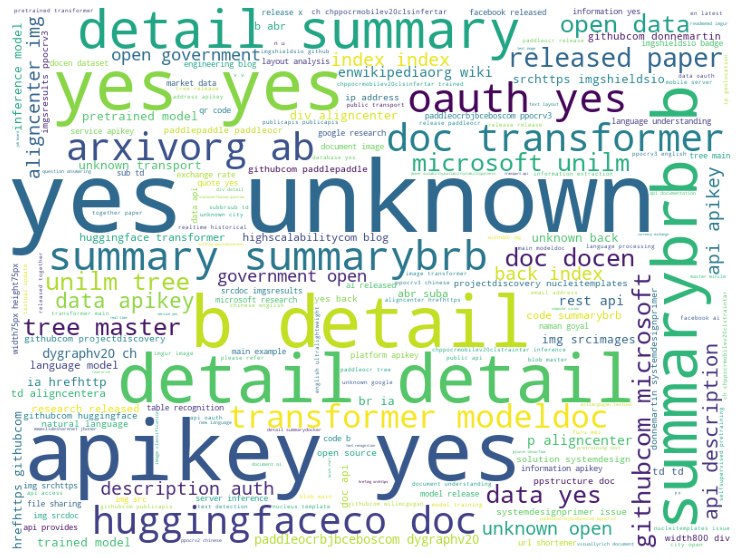

In [ ]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

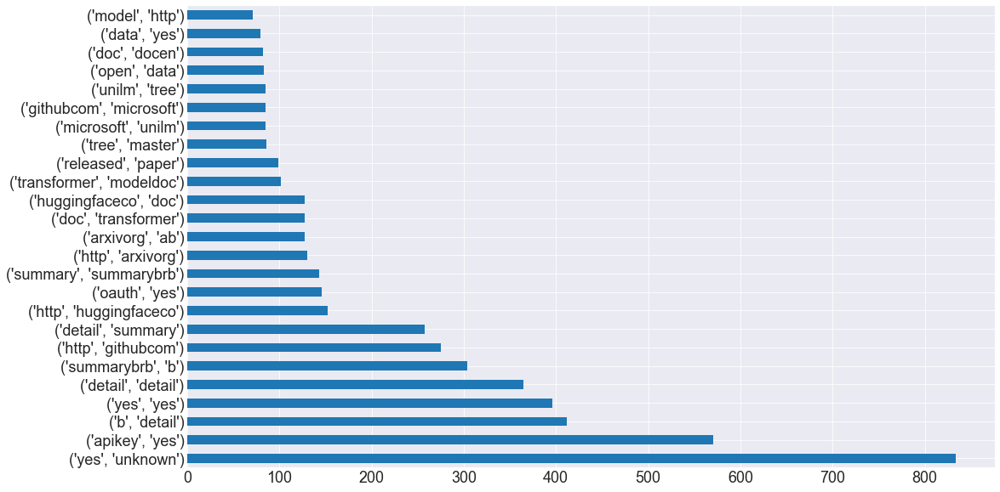

In [ ]:
py_bigrams_l = (pd.Series((nltk.bigrams(py_words_l.split()))).astype('string'))
py_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized JavaScript Words

<AxesSubplot:>

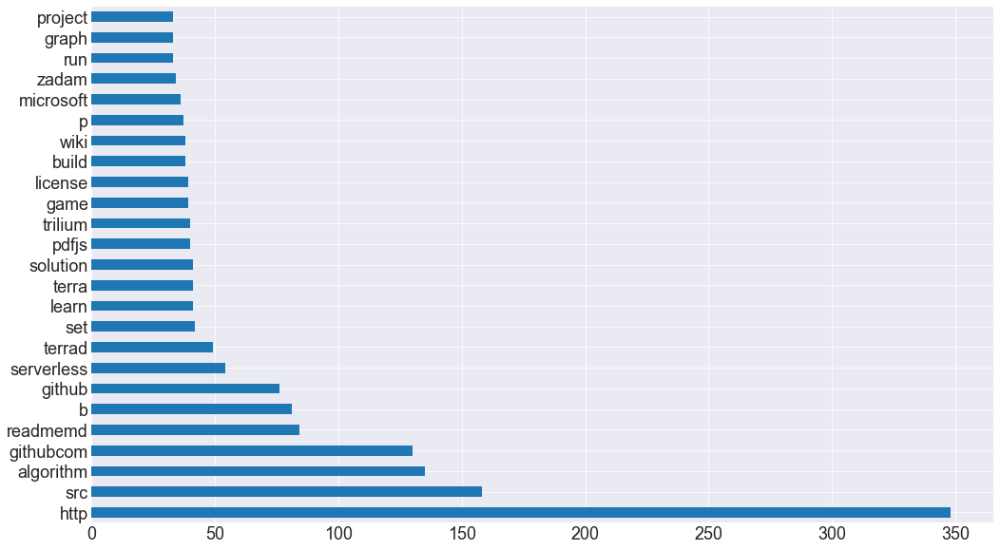

In [ ]:
java_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

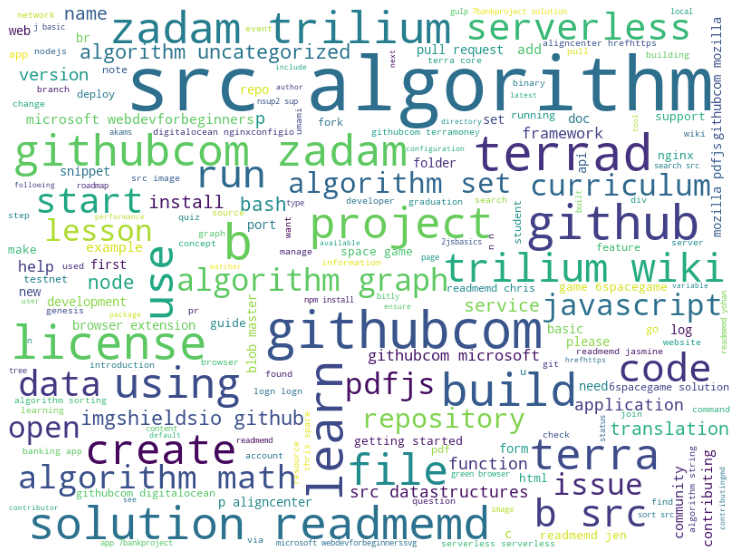

In [ ]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

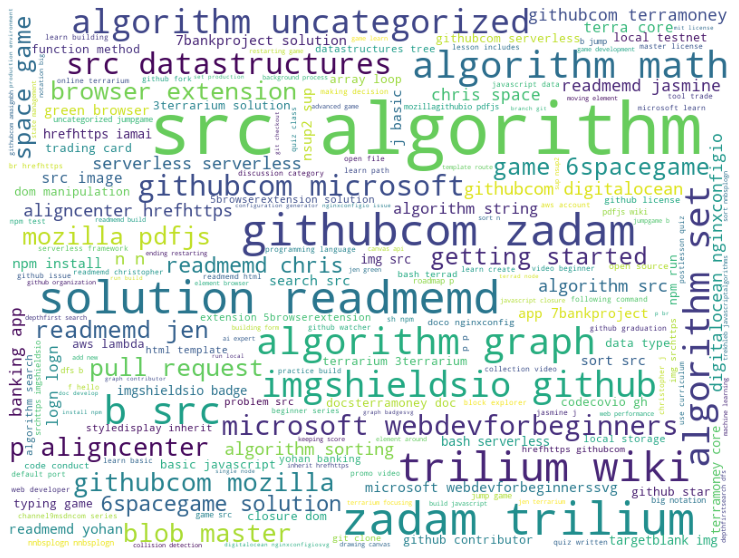

In [ ]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

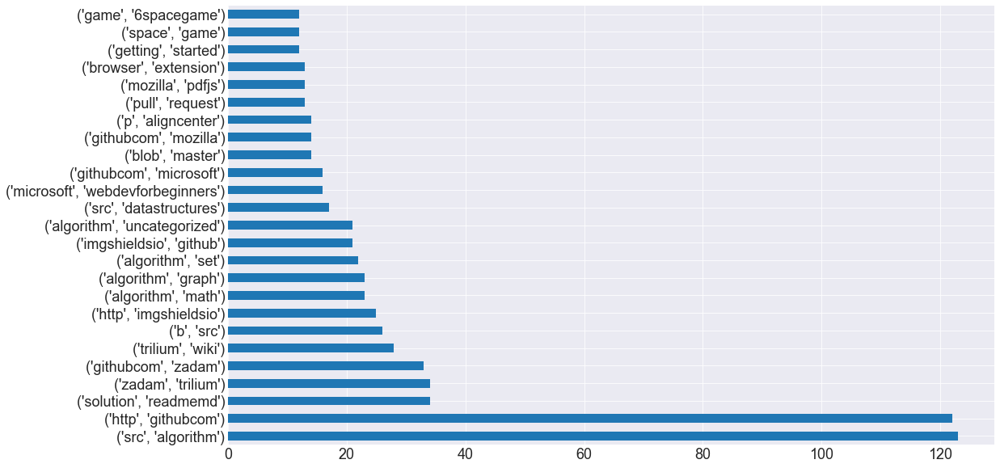

In [ ]:
java_bigrams_l = (pd.Series((nltk.bigrams(java_words_l.split()))).astype('string'))
java_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized HTML Words

<AxesSubplot:>

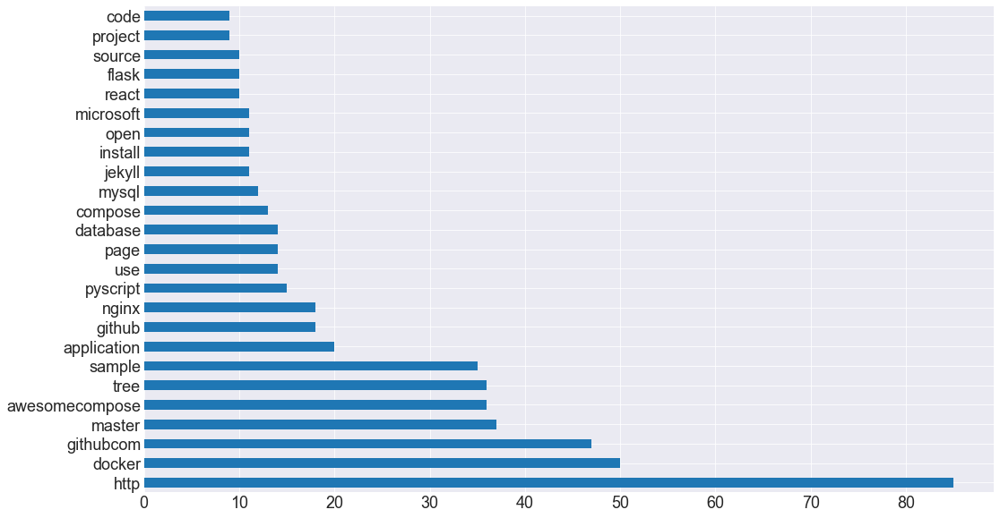

In [ ]:
html_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

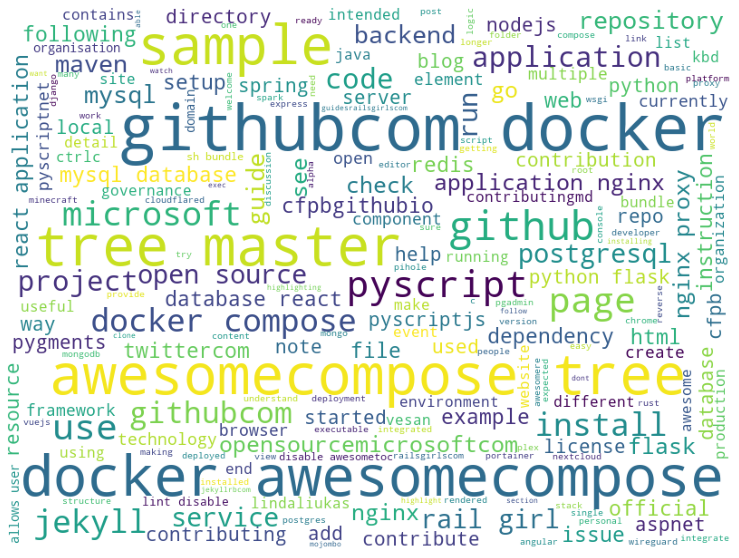

In [ ]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

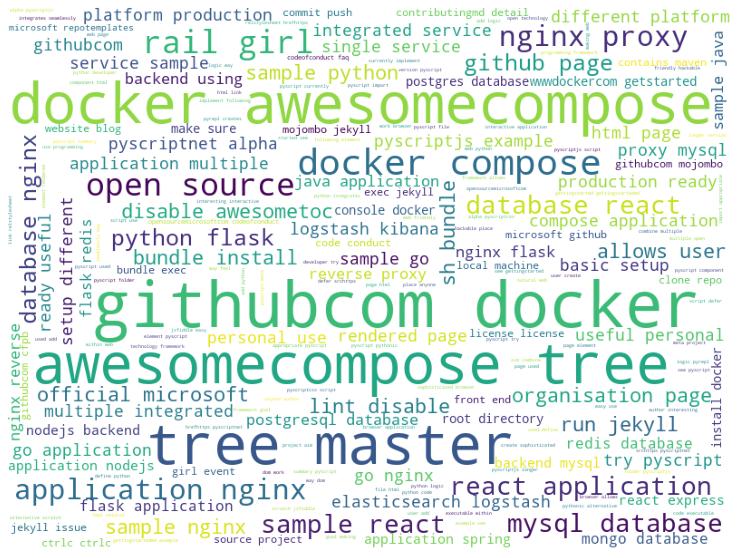

In [ ]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

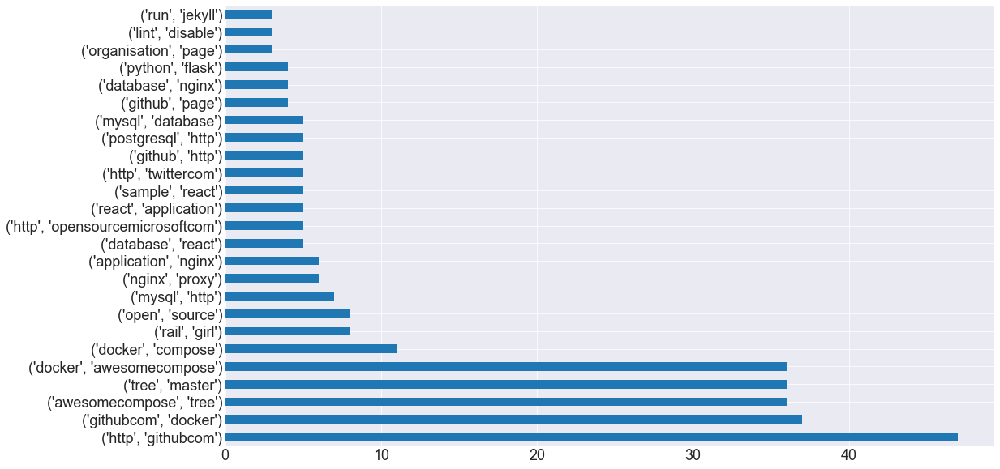

In [ ]:
html_bigrams_l = (pd.Series((nltk.bigrams(html_words_l.split()))).astype('string'))
html_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized TypeScript Words

<AxesSubplot:>

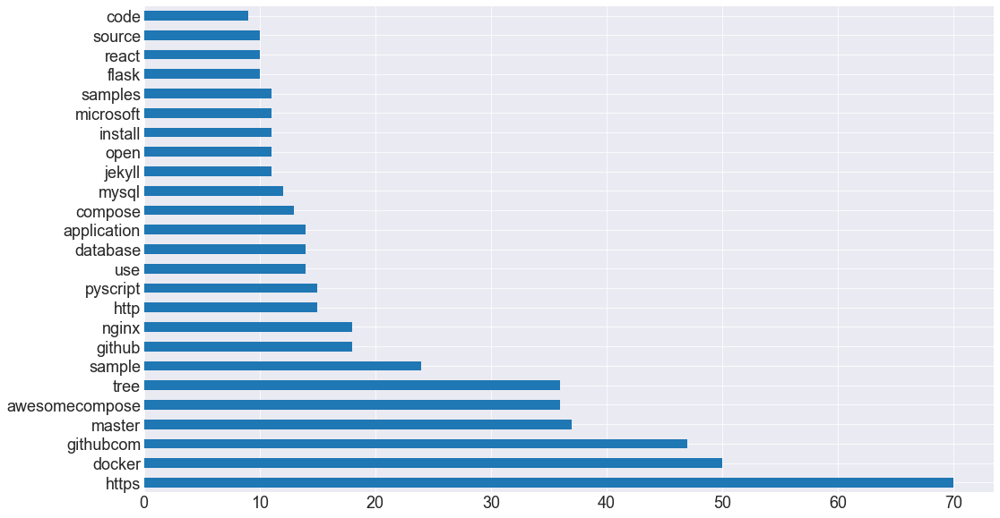

In [ ]:
types_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

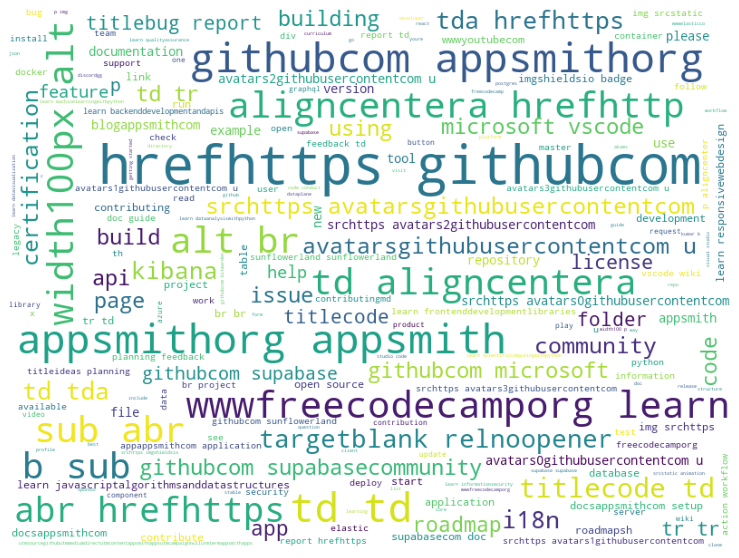

In [ ]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

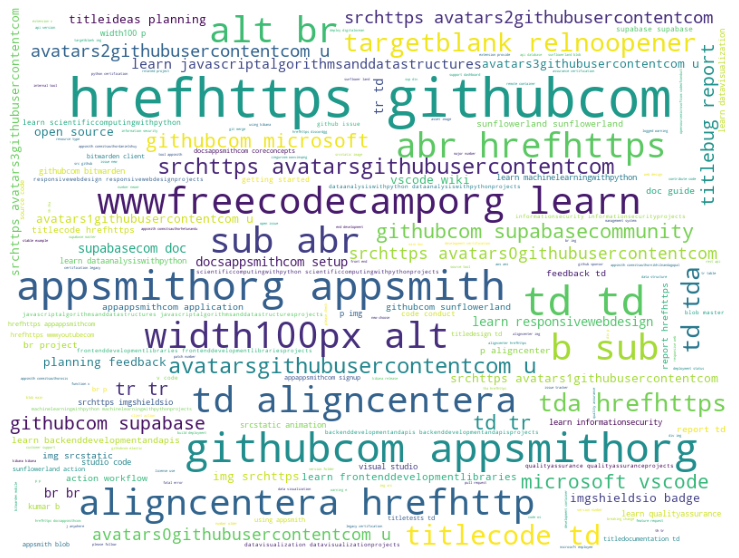

In [ ]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

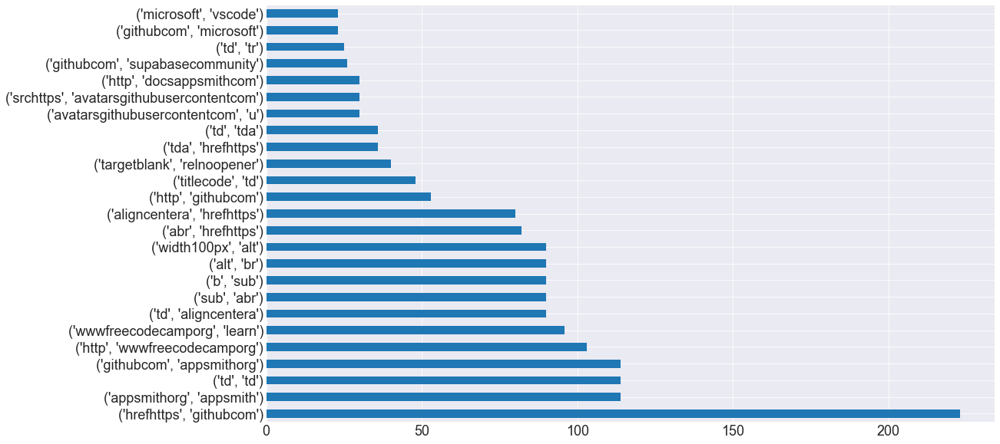

In [ ]:
types_bigrams_l = (pd.Series((nltk.bigrams(types_words_l.split()))).astype('string'))
types_bigrams_l.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

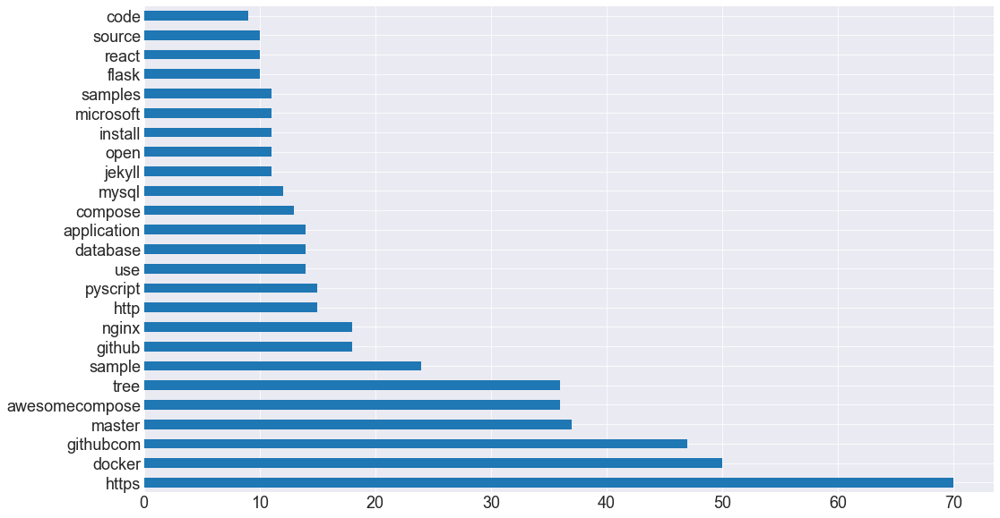

In [ ]:
css_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

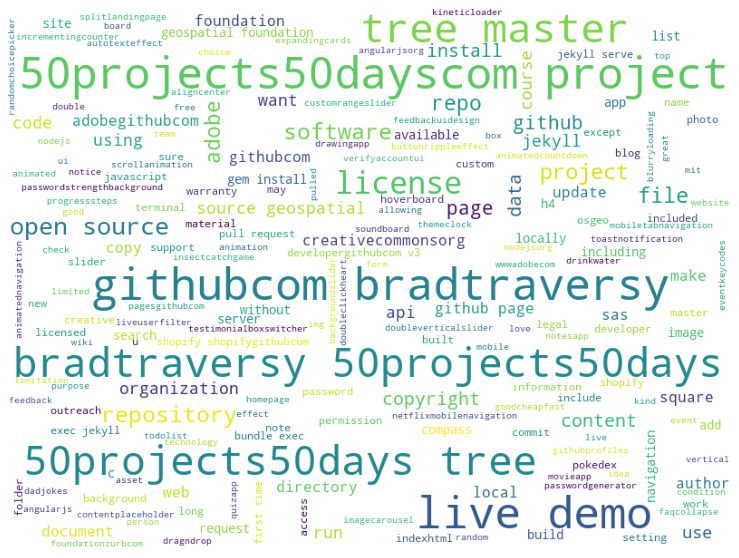

In [ ]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

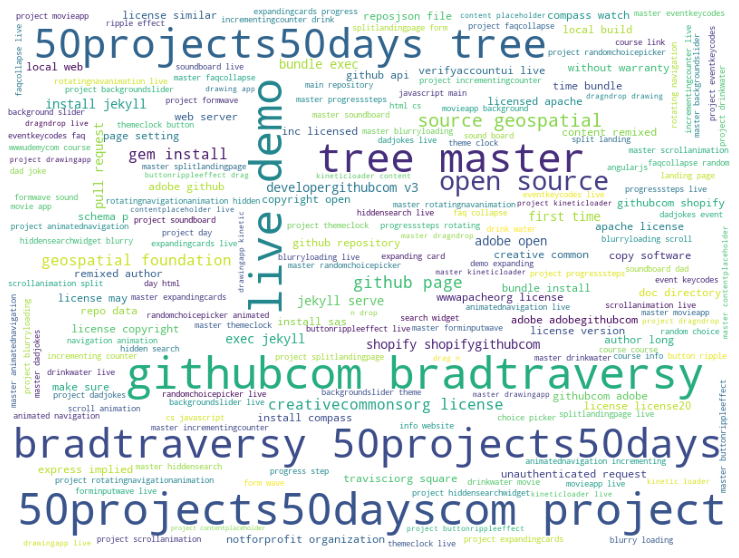

In [ ]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

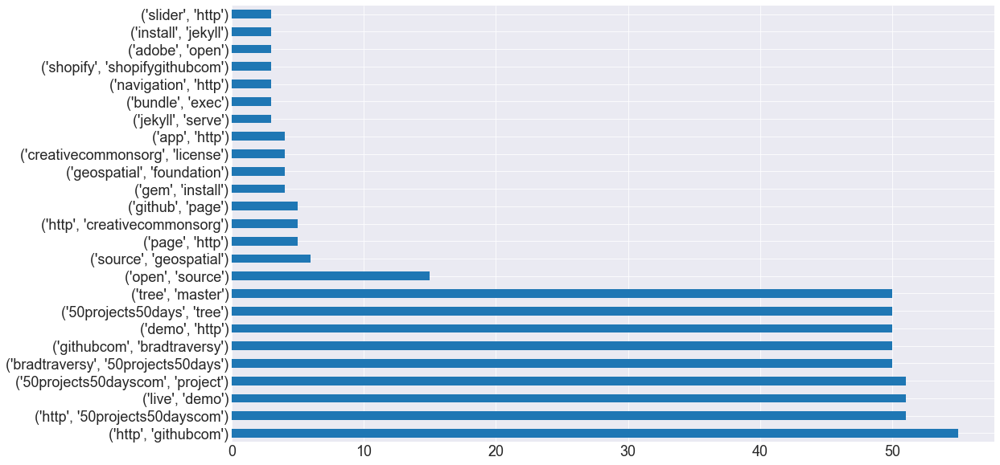

In [ ]:
css_bigrams_l = (pd.Series((nltk.bigrams(css_words_l.split()))).astype('string'))
css_bigrams_l.value_counts().head(25).plot.barh()